##**Librerias**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
plt.style.use('seaborn-whitegrid')
#%matplotlib qt
plt.close('all')
%cd "/content/drive/My Drive/Colab Notebooks/PD"
%run funciones.ipynb

<ipython-input-1-e51d37344273>:6: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


/content/drive/My Drive/Colab Notebooks/PD


##selección de hiperparametros

In [ ]:
!pip install tensorflow scikit-learn
!pip install scikeras

In [ ]:
!pip install keras
from keras.models import Sequential
from sklearn.model_selection import GridSearchCV
from keras.layers import LSTM

In [ ]:
from keras_tuner import RandomSearch, Hyperband, BayesianOptimization
from keras_tuner.engine.hyperparameters import HyperParameters

# Create LSTM function for sklearn grid search
def create_lstm_model(hp):
    model = Sequential()
    model.add(LSTM(units=hp.Int('units', min_value=32, max_value=256, step=32),
                   activation=hp.Choice('activation', values=['relu', 'tanh', 'sigmoid']),
                   input_shape=(3, n_features),
                   return_sequences=False))

    for i in range(hp.Int('n_layers', 1, 3)):
        model.add(LSTM(units=hp.Int(f'lstm_{i}_units', min_value=32, max_value=256, step=32),
                       return_sequences=False))

    model.add(Dense(units=1))
    model.compile(loss=hp.Choice('loss', values=['mean_squared_error', 'mean_absolute_error']),
                  optimizer=hp.Choice('optimizer', values=['SGD', 'RMSprop', 'Adam']),
                  metrics=['mae'])
    return model

# Create the tuner
tuner = RandomSearch(
    create_lstm_model,
    objective='val_loss',
    max_trials=4,
    executions_per_trial=1,
    )
tuner = RandomSearch(
    create_lstm_model,
    objective='val_loss',
    max_combinaciones=4,
    ejecuciones_por_combinacion=1,
    )
# EarlyStopping callback
early_stopper = EarlyStopping(monitor='val_loss', min_delta=0.01, patience=10, restore_best_weights=True)

# Run the search
tuner.search(
      X_train,
      y_train,
      epochs=hp.Int('epochs', min_value=10,
                    max_value=95, step=10),
      batch_size=32,
      validation_data=(X_test, y_test),
      callbacks=[early_stopper]
      )

# Get the best model and hyperparameters
best_model = tuner.get_best_models(num_models=1)[0]
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Best hyperparameters: ", best_hyperparameters.values)
best_model.summary()

# Evaluate the best model on the validation set
val_loss, val_mae = best_model.evaluate(X_test, y_test)
print(f'Validation Loss: {val_loss}, Validation MAE: {val_mae}')

# Save the results
tuner_result = tuner.results_summary()


## algoritmo genetico

In [ ]:
!pip install pygad

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pygad
from sklearn.metrics import mean_squared_error as mse
from sys import stdout

In [ ]:
data=pd.read_excel("/content/drive/MyDrive/Colab Notebooks/PD/maes/File_S1.xlsx")
X = data.values[1:,8:].astype('float32')
wl = np.linspace(350, 2500, X.shape[1])
y = data["TOC"].values[1:].astype("float32")

# Pick one solution only to be the target
target_sp = X[0,:]
def fitness_function(ga_instance, solution, solution_idx):
    # The fitness must increase, so we take the inverse of the MSE
    fitness = 1.0 / mse(target_sp,solution)
    return fitness
def on_gen(ga_instance):
    stdout.write("\r"+str(ga_instance.generations_completed))
    stdout.write(" ")
    stdout.write(str(1.0/ga_instance.best_solution()[1]))
    stdout.flush()

ga_instance = pygad.GA(num_generations = 10000,
                       num_parents_mating = 10, # Number of selected solution for crossover based on their fitness
                       fitness_func = fitness_function, # Defined above
                       sol_per_pop = 50, # Solutions in a population
                       num_genes = target_sp.size, # Number of elements in each solution. Same as the shape of the target spectrum
                       init_range_low = 0.4, # Constraints the lower value each initial gene can take
                       init_range_high = 1.8,# Constraints the higher value each initial gene can take
                       mutation_percent_genes = 0.5, # Mutation rate in percent
                       mutation_type = "random", # See below
                       mutation_by_replacement = True, # This and the above specify that mutation will randomly replace one element of the array
                       random_mutation_min_val = 0.0, # Also the mutation result can be constrained with a min and max
                       random_mutation_max_val = 0.5, # See above
                       on_generation = on_gen) # Some other action to be performed in a generation can be specified here

In [ ]:
ga_instance.run()

10000 4.62060455108051e-06

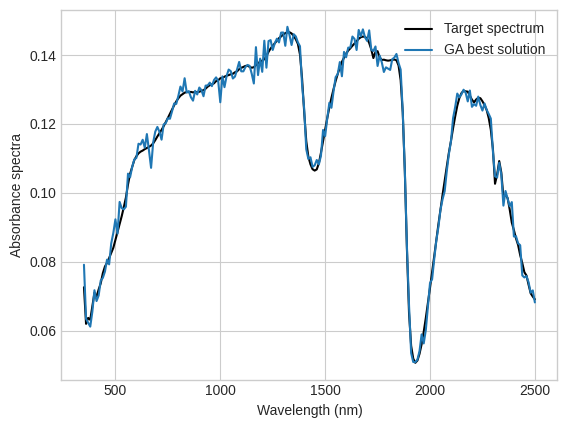

In [ ]:
plt.plot(wl, target_sp, 'k', label="Target spectrum")
plt.plot(wl,ga_instance.best_solution()[0], label="GA best solution")
plt.xlabel("Wavelength (nm)")
plt.ylabel("Absorbance spectra")
plt.legend()
plt.show()

## Porcentajes de maes

In [ ]:
from scipy import signal

In [ ]:
pacientes=df_cnn['id_case'].unique()

(30.0, 55.0)

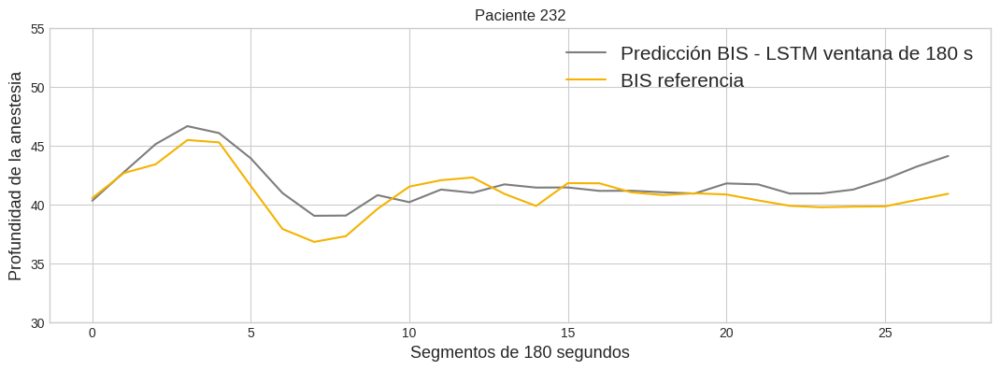

In [ ]:
a=232
df_cnn=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/lstm/300/lstm_1/lstm_predic_eachpac_300.csv")
values_cnn = df_cnn[df_cnn['id_case'].isin([a])]['bis_prediction'].values
values_target=df_cnn[df_cnn['id_case'].isin([a])]['bis_target'].values
values_cnn = signal.savgol_filter(values_cnn, window_length=15, polyorder=6, mode="nearest")
values_target= signal.savgol_filter(values_target, window_length=15, polyorder=6, mode="nearest")
plt.figure(figsize=(13, 9))
plt.subplot(211)
plt.title('Paciente '+str(a))
plt.plot(values_cnn,'#7D7D7D',label='Predicción BIS - LSTM ventana de 180 s')
plt.legend()
plt.subplot(211)
plt.plot(values_target,'#F5B300', label='BIS referencia')
plt.xlabel('Segmentos de 180 segundos', fontsize=13)
plt.ylabel('Profundidad de la anestesia',fontsize=13)
plt.legend(prop={'size': 15})
plt.ylim(30,55)

In [ ]:
#ventana de 60
#len(pacientes)
for i in range(320,360,1):
  a=pacientes[i]
  a=369
  df_cnn=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/cnn/60/cnn_5/cnn_predic_eachpac_60.csv")
  df_lstm=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/lstm/60/lstm_6/lstm_predic_eachpac_60.csv")
  values_cnn = df_cnn[df_cnn['id_case'].isin([a])]['bis_prediction'].values
  values_lstm = df_lstm[df_lstm['id_case'].isin([a])]['bis_prediction'].values
  values_target=df_cnn[df_lstm['id_case'].isin([a])]['bis_target'].values

  values_cnn = signal.savgol_filter(values_cnn, window_length=15, polyorder=6, mode="nearest")
  values_lstm= signal.savgol_filter(values_lstm, window_length=15, polyorder=6, mode="nearest")
  values_target= signal.savgol_filter(values_target, window_length=15, polyorder=6, mode="nearest")
  plt.figure(figsize=(13, 15))
  plt.subplot(311)
  plt.title('Paciente '+str(a))
  plt.plot(values_cnn,'#7D7D7D',label='Predicción BIS - CNN')
  plt.legend()
  plt.subplot(311)
  plt.plot(values_lstm,'#004E92', label='Predicción BIS - LSTM')
  plt.legend()
  plt.subplot(311)
  plt.plot(values_target,'#F5B300', label='BIS referencia')
  plt.legend()

  plt.ylabel('valores predichos',fontsize=20,fontweight='bold')
  plt.xlabel('Valores reales',fontsize=20,fontweight='bold')
  plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
  plt.xticks(fontweight='bold')  # Establecer la negrita para los nÃºmeros en el eje x
  plt.yticks(fontweight='bold')
  #plt.legend(prop={'size': 5, 'weight': 'bold'})
  plt.ylim(20,70)


  #ventana de 180
  df_cnn=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/cnn/180/cnn_5/cnn_predic_eachpac_180.csv")
  df_lstm=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/lstm/180/lstm_4/lstm_predic_eachpac_180.csv")
  values_cnn = df_cnn[df_cnn['id_case'].isin([a])]['bis_prediction'].values
  values_lstm = df_lstm[df_lstm['id_case'].isin([a])]['bis_prediction'].values
  values_target=df_cnn[df_lstm['id_case'].isin([a])]['bis_target'].values

  values_cnn = signal.savgol_filter(values_cnn, window_length=15, polyorder=6, mode="nearest")
  values_lstm= signal.savgol_filter(values_lstm, window_length=15, polyorder=6, mode="nearest")
  values_target= signal.savgol_filter(values_target, window_length=15, polyorder=6, mode="nearest")
  #plt.figure(figsize=(5, 9))
  plt.subplot(312)
  plt.plot(values_cnn,'#004E92',label='Predicción BIS - LSTM')
  plt.legend()
  plt.subplot(312)
  plt.plot(values_lstm,'#7D7D7D', label='Predicción BIS - CNN')
  plt.legend()
  plt.subplot(312)
  plt.plot(values_target,'#F5B300', label='BIS referencia')
  plt.legend()

  plt.ylabel('valores predichos',fontsize=20,fontweight='bold')
  plt.xlabel('Valores reales',fontsize=20,fontweight='bold')
  plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
  plt.xticks(fontweight='bold')  # Establecer la negrita para los nÃºmeros en el eje x
  plt.yticks(fontweight='bold')
  #plt.legend(prop={'size': 5, 'weight': 'bold'})
  plt.ylim(20,70)


  #ventana de 300
  df_cnn=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/cnn/300/cnn_4/cnn_predic_eachpac_300.csv")
  df_lstm=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/lstm/300/lstm_4/lstm_predic_eachpac_300.csv")
  values_cnn = df_cnn[df_cnn['id_case'].isin([a])]['bis_prediction'].values
  values_lstm = df_lstm[df_lstm['id_case'].isin([a])]['bis_prediction'].values
  values_target=df_cnn[df_lstm['id_case'].isin([a])]['bis_target'].values

  values_cnn = signal.savgol_filter(values_cnn, window_length=15, polyorder=6, mode="nearest")
  values_lstm= signal.savgol_filter(values_lstm, window_length=15, polyorder=6, mode="nearest")
  values_target= signal.savgol_filter(values_target, window_length=15, polyorder=6, mode="nearest")

  #plt.figure(figsize=(10, 8))
  plt.subplot(313)
  plt.plot(values_cnn,'#7D7D7D',label='Predicción BIS - CNN')
  plt.legend()
  plt.subplot(313)
  plt.plot(values_lstm,'#004E92', label='Predicción BIS - LSTM')
  plt.legend()
  plt.subplot(313)
  plt.plot(values_target,'#F5B300', label='BIS referencia')
  plt.legend()

  plt.ylabel('valores predichos',fontsize=15,fontweight='bold')
  plt.xlabel('Valores reales',fontsize=15,fontweight='bold')
  plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
  plt.xticks(fontweight='bold')  # Establecer la negrita para los nÃºmeros en el eje x
  plt.yticks(fontweight='bold')
  #plt.legend(prop={'size': 5, 'weight': 'bold'})
  plt.ylim(20,70)

(10.0, 100.0)

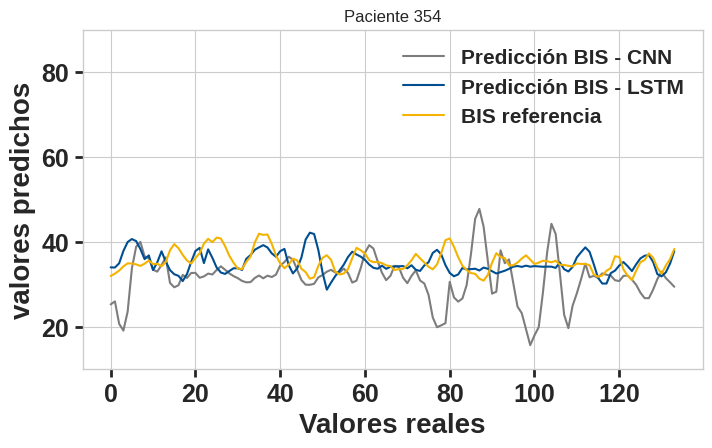

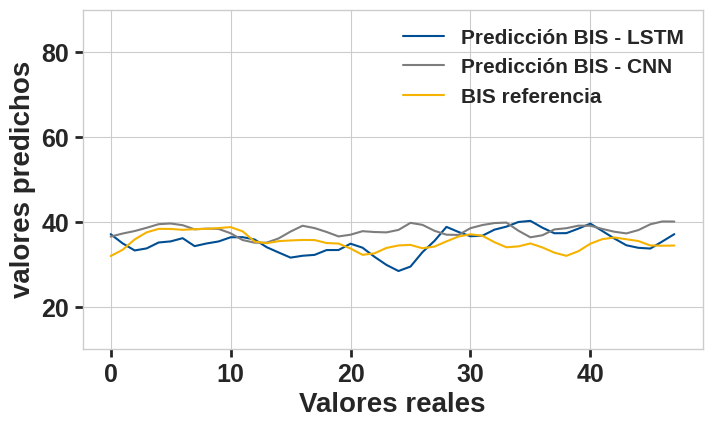

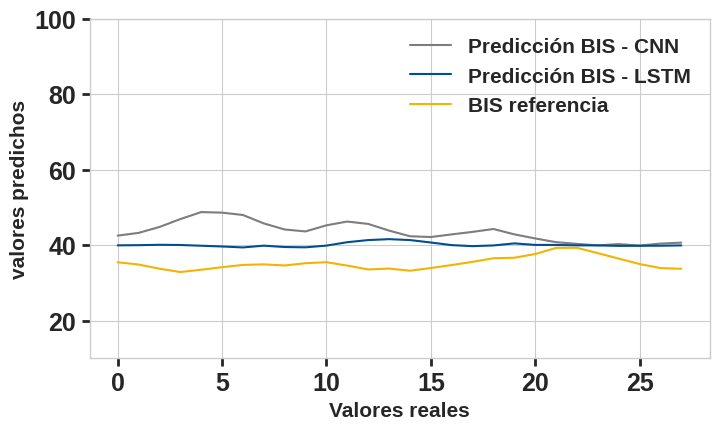

In [ ]:
  a=354
  df_cnn=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/cnn/60/cnn_5/cnn_predic_eachpac_60.csv")
  df_lstm=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/lstm/60/lstm_6/lstm_predic_eachpac_60.csv")
  values_cnn = df_cnn[df_cnn['id_case'].isin([a])]['bis_prediction'].values
  values_lstm = df_lstm[df_lstm['id_case'].isin([a])]['bis_prediction'].values
  values_target=df_cnn[df_lstm['id_case'].isin([a])]['bis_target'].values

  values_cnn = signal.savgol_filter(values_cnn, window_length=15, polyorder=6, mode="nearest")
  values_lstm= signal.savgol_filter(values_lstm, window_length=15, polyorder=6, mode="nearest")
  values_target= signal.savgol_filter(values_target, window_length=15, polyorder=6, mode="nearest")
  plt.figure(figsize=(8, 15))
  plt.subplot(311)
  plt.title('Paciente '+str(a))
  plt.plot(values_cnn,'#7D7D7D',label='Predicción BIS - CNN')
  plt.legend()
  plt.subplot(311)
  plt.plot(values_lstm,'#004E92', label='Predicción BIS - LSTM')
  plt.legend()
  plt.subplot(311)
  plt.plot(values_target,'#F5B300', label='BIS referencia')
  plt.legend()

  plt.ylabel('valores predichos',fontsize=20,fontweight='bold')
  plt.xlabel('Valores reales',fontsize=20,fontweight='bold')
  plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
  plt.xticks(fontweight='bold')  # Establecer la negrita para los nÃºmeros en el eje x
  plt.yticks(fontweight='bold')
  plt.legend(prop={'size': 15, 'weight': 'bold'})
  plt.ylim(10,90)


  #ventana de 180
  df_cnn=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/cnn/180/cnn_5/cnn_predic_eachpac_180.csv")
  df_lstm=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/lstm/180/lstm_4/lstm_predic_eachpac_180.csv")
  values_cnn = df_cnn[df_cnn['id_case'].isin([a])]['bis_prediction'].values
  values_lstm = df_lstm[df_lstm['id_case'].isin([a])]['bis_prediction'].values
  values_target=df_cnn[df_lstm['id_case'].isin([a])]['bis_target'].values

  values_cnn = signal.savgol_filter(values_cnn, window_length=15, polyorder=6, mode="nearest")
  values_lstm= signal.savgol_filter(values_lstm, window_length=15, polyorder=6, mode="nearest")
  values_target= signal.savgol_filter(values_target, window_length=15, polyorder=6, mode="nearest")
  plt.figure(figsize=(8, 15))
  plt.subplot(312)
  plt.plot(values_cnn,'#004E92',label='Predicción BIS - LSTM')
  plt.legend()
  plt.subplot(312)
  plt.plot(values_lstm,'#7D7D7D', label='Predicción BIS - CNN')
  plt.legend()
  plt.subplot(312)
  plt.plot(values_target,'#F5B300', label='BIS referencia')
  plt.legend()

  plt.ylabel('valores predichos',fontsize=20,fontweight='bold')
  plt.xlabel('Valores reales',fontsize=20,fontweight='bold')
  plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
  plt.xticks(fontweight='bold')  # Establecer la negrita para los nÃºmeros en el eje x
  plt.yticks(fontweight='bold')
  plt.legend(prop={'size': 15, 'weight': 'bold'})
  plt.ylim(10,90)


  #ventana de 300
  df_cnn=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/cnn/300/cnn_4/cnn_predic_eachpac_300.csv")
  df_lstm=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/lstm/300/lstm_4/lstm_predic_eachpac_300.csv")
  values_cnn = df_cnn[df_cnn['id_case'].isin([a])]['bis_prediction'].values
  values_lstm = df_lstm[df_lstm['id_case'].isin([a])]['bis_prediction'].values
  values_target=df_cnn[df_lstm['id_case'].isin([a])]['bis_target'].values

  values_cnn = signal.savgol_filter(values_cnn, window_length=15, polyorder=6, mode="nearest")
  values_lstm= signal.savgol_filter(values_lstm, window_length=15, polyorder=6, mode="nearest")
  values_target= signal.savgol_filter(values_target, window_length=15, polyorder=6, mode="nearest")

  plt.figure(figsize=(8, 15))
  plt.subplot(313)
  plt.plot(values_cnn,'#7D7D7D',label='Predicción BIS - CNN')
  plt.legend()
  plt.subplot(313)
  plt.plot(values_lstm,'#004E92', label='Predicción BIS - LSTM')
  plt.legend()
  plt.subplot(313)
  plt.plot(values_target,'#F5B300', label='BIS referencia')
  plt.legend()

  plt.ylabel('valores predichos',fontsize=15,fontweight='bold')
  plt.xlabel('Valores reales',fontsize=15,fontweight='bold')
  plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
  plt.xticks(fontweight='bold')  # Establecer la negrita para los nÃºmeros en el eje x
  plt.yticks(fontweight='bold')
  plt.legend(prop={'size': 15, 'weight': 'bold'})
  plt.ylim(10,100)

In [ ]:
df=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/cnn/300/cnn_4/metrics_cnn_300.csv")

In [ ]:
np.mean(df['mse'].values)

122980.55949381062

In [ ]:
np.mean(df['mape'].values)

51.486220373737375

In [ ]:
np.mean(df['corr'].values)

0.005700351010101012

In [ ]:
np.mean(df['r2'].values)

-21.812895707070705

In [ ]:
import pandas as pd
import numpy as np


def calcular_porcentajes_intervalos(df, column_id, column_mea, interval_size):
    min_mea = df[column_mea].min()
    max_mea = df[column_mea].max()
    bins = np.arange(min_mea, max_mea, interval_size)

    if max_mea not in bins:
        bins = np.append(bins, max_mea + interval_size)  # Asegurar que el último intervalo incluye max_mea

    # Crear los intervalos
    df['interval'] = pd.cut(df[column_mea], bins, include_lowest=True, right=False)

    # Eliminar filas con 0 pacientes
    interval_counts = df['interval'].value_counts().sort_index()
    interval_counts = interval_counts[interval_counts > 0]

    total_patients = len(df)
    percentages = (interval_counts / total_patients) * 100

    # Asegurar que la suma de los porcentajes sea 100%
    percentages = percentages / percentages.sum() * 100
    formatted_intervals = [f"[{interval.left:.2f}, {interval.right:.2f})" for interval in interval_counts.index]
    results = pd.DataFrame({
        'Interval': formatted_intervals,
        'Patients': interval_counts.values,
        'Percentage': percentages.values
    })

    # Eliminar la columna 'interval' del DataFrame original
    df.drop(columns=['interval'], inplace=True)

    return results

# Usar la función con un intervalo de tamaño 5
interval_size = 5
resultado = calcular_porcentajes_intervalos(df, 'pac', 'mae', interval_size)

# Mostrar los resultados
print("\nResultados de la distribución en intervalos:")
resultado.head(20)




Resultados de la distribución en intervalos:


,Interval,Patients,Percentage
0,"[3.21, 8.21)",136,34.343434
1,"[8.21, 13.21)",158,39.898990
2,"[13.21, 18.21)",69,17.424242
3,"[18.21, 23.21)",24,6.060606
4,"[23.21, 28.21)",4,1.010101
5,"[28.21, 33.21)",1,0.252525
6,"[33.21, 38.21)",1,0.252525
7,"[38.21, 43.21)",1,0.252525
8,"[68.21, 73.21)",1,0.252525
9,"[73.21, 80.57)",1,0.252525


In [ ]:
# @title Interval vs Percentage

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(resultado['Interval'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(resultado, x='Percentage', y='Interval', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

## Graficas valores reales y predichos

In [ ]:
df=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/resultados/lstm/60/lstm_6/lstm_predic_eachpac_60.csv")

In [ ]:

plt.figure(figsize=(4, 8))
plt.scatter(df['bis_target'].values, df['bis_prediction'].values,
            color='blue', s=10, marker='s')
plt.plot([0, 100], [0, 100], color='black', linestyle='--')
plt.ylabel('valores predichos',fontsize=20,fontweight='bold')
plt.xlabel('Valores reales',fontsize=20,fontweight='bold')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los nÃºmeros en el eje x
plt.yticks(fontweight='bold')
#plt.xlim(0,70)
plt.ylim(0,100)

In [ ]:
plt.figure(figsize=(20, 6))
plt.subplot(211)
plt.scatter(df['bis_prediction'].values,df['bis_prediction'].values-df['bis_target'].values,color="blue", s=10,label='PredicciÃ³n BIS')
# plotting line for zero residual error
plt.hlines(y=0, xmin=0, xmax=101, linewidth=2);
plt.ylabel('valores predichos - valores reales',fontsize=20,fontweight='bold');
plt.xlabel('Valores predichos',fontsize=20,fontweight='bold');
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out");
plt.xticks(fontweight='bold')  # Establecer la negrita para los nÃºmeros en el eje x
plt.yticks(fontweight='bold')
plt.xlim(20,60)
plt.ylim(-40,40)

## **Prueba segmentos seguidos**

In [ ]:
# @title Texto de título predeterminado
df=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/prueba_pacientes/dataframes_prueba/windows_60/df_60.csv")
df = df.drop(['est_mean_geom_ecg','subjectid','casestart','caseend','anestart','aneend','opstart','opend',
              'est_max_bis','est_min_bis','est_mean_bis','est_std_bis',
              'est_var_bis','est_mean_geom_bis','iv2','aline1'], axis=1)
df.rename(columns={'ind': 'id_case'}, inplace=True)
df=Quitar_nulos(df)  #"imprimir los nulos en cada columna"
df=QuitarCardinalidad1(df) #"imprimir las colunmas con cardinalidad 1"
df=CodificarCategoricas(df)
bool_columns = df.select_dtypes(include='bool')
df[bool_columns.columns] = bool_columns.astype('uint8')
df=QuitarColumVarianzaCero(df) #imprimir las columnas con varianza cero


-----------------VALORES NULOS----------------------
asa:914
pacientes con nulos asa:[207 349 228 105 406]
frac_psdslope_hrv:1
pacientes con nulos asa:[0]
frac_h_hrv:12
pacientes con nulos asa:[0]
frac_dfa_hrv:19
pacientes con nulos asa:[0]
ent_sampen_hrv:2
ent_qsa_hrv:2
sdnn_index:41
pacientes con nulos asa:[0]
sdann:92
pacientes con nulos asa:[0]
dfa_alpha1:28
pacientes con nulos asa:[0]
dfa_alpha2:28
pacientes con nulos asa:[0]
frac_psdslope_hr:1
pacientes con nulos asa:[0]
frac_h_hr:12
pacientes con nulos asa:[0]
frac_dfa_hr:19
pacientes con nulos asa:[0]
ent_sampen_hr:2
ent_qsa_hr:2
-----------------CARDINALIDAD----------------------
key           1825
sex              2
department       4
optype          11
dx             168
opname          84
approach         3
position         8
ane_type         1
preop_ecg        4
preop_pft        8
airway           2
iv1              9
dtype: int64
---------------------------VARIANZA CERO------------------------
Index(['ent_shanen_ecg'], dt

In [ ]:
VIF_less_th_5=QuitarMulticolinealidad(df.drop(['est_median_bis','key','id_case'],axis=1))

### Redes neuronales: CNN

In [ ]:
# univariate cnn example
!pip install keras
from numpy import array
import joblib
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.layers import MaxPooling1D
from numpy import hstack

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GroupShuffleSplit
from scipy import signal


In [ ]:
#X=df_x.drop(['est_median_bis','id_case'], axis=1)

lista=['est_max_ecg','est_min_ecg','est_median_ecg','est_mean_ecg','est_var_ecg','acorr_ecg_max','acorr_ecg_min','acorr_ecg_median',
       'acorr_ecg_mean','acorr_ecg_var','frac_psdslope_ecg','frac_dfd_ecg','frac_dfa_ecg','ent_tsen_ecg',
       'ent_svden_ecg','ent_klen_ecg','ssc_ecg','est_var_hrv','acorr_hrv_max','acorr_hrv_min','frac_psdslope_hrv',
        'frac_dfd_hrv','frac_h_hrv','ent_shanen_hrv','ent_powen_hrv','nni_diff_min','sdnn_index','sdann',
        'tinn_m','tinn','tri_index','hf','lf_hf','sd_ratio','ellipse_area','dfa_alpha2',
        'sdi','est_var_hr','acorr_hr_max','acorr_hr_median','ent_sampen_hr','ssc_hr']

'''
lista=['est_max_ecg', 'est_min_ecg', 'est_median_ecg', 'est_mean_ecg', 'est_var_ecg', 'acorr_ecg_min', 'acorr_ecg_median',
        'acorr_ecg_mean', 'acorr_ecg_var', 'frac_pfd_ecg', 'frac_psdslope_ecg', 'frac_dfd_ecg', 'frac_dfa_ecg', 'ent_shanen_ecg',
        'ent_powen_ecg', 'ent_tsen_ecg', 'ent_sampen_ecg', 'ent_svden_ecg', 'est_max_hrv', 'est_var_hrv', 'acorr_hrv_min',
        'frac_psdslope_hrv', 'frac_h_hrv', 'ent_shanen_hrv', 'ent_powen_hrv', 'nni_diff_min', 'sdann', 'tinn_m', 'tinn',
        'tri_index', 'lf', 'hf', 'lf_hf', 'sd_ratio', 'ellipse_area', 'dfa_alpha1', 'sdi', 'est_max_hr', 'acorr_hr_median',
        'frac_dfd_hr', 'ent_sampen_hr', 'ent_cren_hr']
'''

'''
 'id_case',
 'age',
 'height',
 'bmi',
 'preop_dm',
 'intraop_ppf',
 'intraop_ftn',
 'intraop_rocu',
 'intraop_eph',
 'intraop_phe',

 '''
len(lista)


#### Entrenando y probando con pacientes- codigos pasados

In [ ]:
df_x=df.copy()
#extrayendo los valores unicos de id
#X=df_x.drop(['est_median_bis','id_case'], axis=1)
id_unique=df_x['key'].unique().tolist()
conteo_valores = df_x['key'].value_counts()
#id_unique = conteo_valores[conteo_valores < 6].index.tolist()
#df_filtrado = df_x[~df_x['key'].isin(id_unique)].reset_index(drop=True)

gss = GroupShuffleSplit(n_splits=1, test_size=0.2)
train_index, test_index = next(gss.split(df_x[lista], df_x['est_median_bis'], groups=df_x['key']))
train_index_lista = df_x.loc[train_index, 'key'].unique()
test_index_lista = df_x.loc[test_index, 'key'].unique()
#selected_test_idcase = np.random.choice(unique_test_idcases)
#selected_test_idcase=1401
lista_results_test=[]

for i in range(0,len(train_index_lista),1):
  n_steps = 3
  X,y=acomodarDatosCNN(df_x,lista,n_steps,i,train_index_lista);
  n_features = X.shape[2]
  if i>0:
    x_testear=X
    y_testear=y
    #model = joblib.load('model.pkl')
    yhat = model.predict(x_testear, verbose=0).T[0]
    mse = mean_squared_error(y_testear, yhat)
    mae = mean_absolute_error(y_testear, yhat)
    try:
      r2 = r2_score(y_testear, yhat)
      correlation_coef, p_value = pearsonr(y_testear, yhat)
    except Exception as e:
      r2 = 0
      correlation_coef = 0
      p_value = 0
    print(f'{mae}---{i}')
    lista_results_test.append((train_index_lista[i-1], mse, mae, r2, correlation_coef, p_value))


  if i==0:
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, n_features)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(50, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=1000, verbose=0)
  else:
    model.fit(X, y, epochs=1000, verbose=0)
joblib.dump(model, 'model.pkl')

#df_resultados = pd.DataFrame(lista_results_test, columns=['id_case', 'mse', 'mae', 'r2', 'correlation_coef', 'p_value'])


In [ ]:
df_x.values.T

####Entrenando con el 70 y probando con el 20 CNN

In [ ]:
!pip install tensorflow pydot

In [ ]:
from tensorflow.keras.utils import plot_model
from keras.layers import LSTM

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler_y = MinMaxScaler()
scaler_X = MinMaxScaler()
df_x=pd.DataFrame(scaler_X.fit_transform(X), columns=X.columns)
for col in df_x.columns:
    df_x[col] = df_x[col].astype(X[col].dtype)
y=scaler_y.fit_transform(y)
df_x = pd.DataFrame(df_x, columns=X.columns)
y=pd.DataFrame(y, columns=['est_median_bis'])
df_x[['key','id_case']] = df[['key','id_case']]
y['key'] = df['key']
y_target=y.copy()

In [ ]:
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.layers import ELU,PReLU,LeakyReLU,Dropout
X=df.drop(columns=['est_median_bis','key','id_case'], axis=1)
y=df['est_median_bis'].values.reshape(-1, 1)
y_target,df_x,TargetVarScalerFit,PredictorScalerFit=escalar_datos(X,y,'estandarizar',df)

df=df.head(1000)
n_steps = 3
n=3
id_unique=df_x['key'].unique().tolist()
conteo_valores = df_x['key'].value_counts()
id_unique = conteo_valores[conteo_valores < n_steps+1].index.tolist()
df_x = df_x[~df_x['key'].isin(id_unique)].reset_index(drop=True)
df_x2=df_x.copy()
df_x2['est_median_bis']=y_target['est_median_bis']
id_unique=sorted(df_x2['id_case'].unique().tolist())
df_train=df_x2[df_x2['id_case'].isin(id_unique[n:len(id_unique)])] #para poder separar 10 pacientes para testear
df_test=df_x2[df_x2['id_case'].isin(id_unique[0:n])]
train_index_lista=df_train['key'].unique().tolist()
test_index_lista=df_test['key'].unique().tolist()
'''
X,y=acomodarDatosCNN(df_x,lista,y_target,n_steps,0,train_index_lista)
n_features = X.shape[2]

model = Sequential()
model.add(Conv1D(filters=60, kernel_size=2, input_shape=(n_steps, n_features)))
model.add(LeakyReLU(alpha=0.01))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(100))
model.add(LeakyReLU(alpha=0.01))
model.add(Dense(100))
model.add(LeakyReLU(alpha=0.01))
model.add(Dense(1))

model = Sequential()
model.add(LSTM(100, activation='relu', input_shape=(n_steps, n_features)))
model.add(Dense(100))
model.add(Dense(100))
model.add(Dense(100))
model.add(Dense(1))

plot_model(model, to_file='cnn_architecture.png', show_shapes=True, show_layer_names=True)
'''
for i in range(0,len(train_index_lista),1):
	X,y=acomodarDatosCNN(df_x,lista,y_target,n_steps,i,train_index_lista);
	n_features = X.shape[2]
	if i==0:
		model = Sequential()
		model.add(Conv1D(filters=120, kernel_size=2, input_shape=(n_steps, n_features)))
		model.add(LeakyReLU(alpha=0.01))
		model.add(MaxPooling1D(pool_size=2))
		model.add(Flatten())
		model.add(Dense(200))
		model.add(LeakyReLU(alpha=0.01))
		model.add(Dense(200))
		model.add(LeakyReLU(alpha=0.01))
		model.add(Dense(200))
		model.add(LeakyReLU(alpha=0.01))
		model.add(Dense(200))
		model.add(LeakyReLU(alpha=0.01))
		model.add(Dense(1))
		model.compile(optimizer='adam', loss='mean_squared_error')  #Adagrad
	model.fit(X, y, epochs=20, verbose=0)
joblib.dump(model, 'model_CNN.pkl')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


['model_CNN.pkl']

In [ ]:
model.history
joblib.dump(model.history.history, 'model_CNN_history.pkl')

['model_CNN_history.pkl']

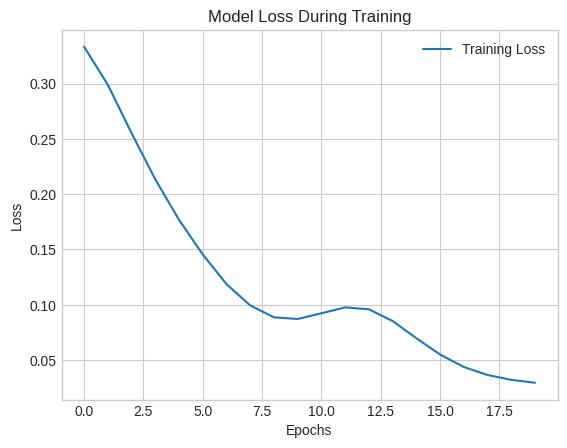

In [ ]:
import joblib
# Load the saved training history
loaded_history = joblib.load('model_CNN_history.pkl')

# Access loss values (or other metrics)
loss_values = loaded_history['loss']

# Now you can use loss_values for plotting or analysis
plt.plot(loss_values, label='Training Loss')
plt.title('Model Loss During Training')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

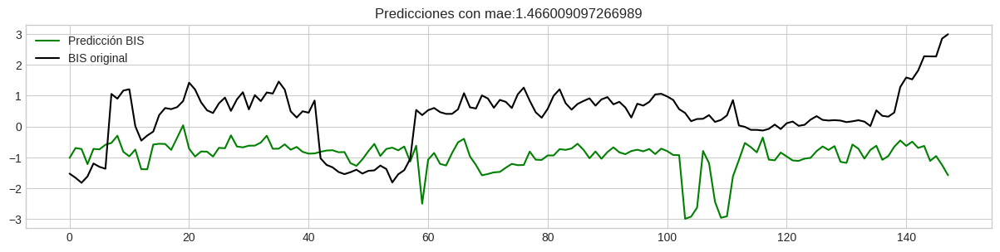

In [ ]:
#PREDECIR POR PACIENTE Y CONCATEANR LAS PREDICCIONES
'''
prefijos = df_test['id_case'].unique().tolist()
lista_de_listas = []
for prefijo in prefijos:
    sublista = [elem for elem in test_index_lista if elem.startswith(str(prefijo))]
    lista_de_listas.append(sublista)
print(lista_de_listas)
print(test_index_lista)
'''

lista_original = test_index_lista
agrupados = {}
for item in lista_original:
    prefijo, sufijo = item.split('_')
    if prefijo not in agrupados:
        agrupados[prefijo] = []
    agrupados[prefijo].append(item)
for key in agrupados:
    agrupados[key].sort(key=lambda x: int(x.split('_')[1]))
lista_de_listas = list(agrupados.values())


cnn_predic_eachpac_60=pd.DataFrame({
    'id_case':[],
    'key':[],
    'bis_prediction':[],
    'bis_target':[]})
#len(lista_de_listas)
for i in range(0,1,1):
  X,y,keys,ids,caract=acomodarDatosCNN2(df_x,lista,y_target,n_steps,lista_de_listas[i])
  caract=caract.iloc[2:,:]
  #caract=TargetVarScalerFit.inverse_transform(caract.reshape(-1, 1)).T[0]
  yhat = model.predict(X, verbose=0).T[0]
  #yhat = TargetVarScalerFit.inverse_transform(yhat.reshape(-1, 1)).T[0]
  ytest = y#TargetVarScalerFit.inverse_transform(y.reshape(-1, 1)).T[0]    #hacer otra funcion para ivertir los datos
  mse = mean_squared_error(ytest, yhat)
  mae = mean_absolute_error(ytest, yhat)
  try:
    r2 = r2_score(ytest, yhat)
    correlation_coef, p_value = pearsonr(ytest, yhat)
  except Exception as e:
    r2 = np.nan
    correlation_coef = np.nan
    p_value = np.nan

  '''
  temp_df = pd.DataFrame({
      'id_case': ids,
      'key': keys,
      'bis_prediction': yhat,
      'bis_target': ytest
  })
  '''

  #cnn_predic_eachpac_60 = pd.concat([cnn_predic_eachpac_60, temp_df], ignore_index=True)
  #yhat = signal.savgol_filter(yhat, window_length=15, polyorder=6, mode="nearest")
  #ytest= signal.savgol_filter(ytest, window_length=15, polyorder=6, mode="nearest")

  plt.figure(figsize=(15, 7))
  plt.subplot(211)
  plt.title(f'Predicciones con mae:{mae}')
  plt.plot(yhat,'-g',label='Predicción BIS')
  plt.legend()
  plt.subplot(211)
  plt.plot(ytest,'-k', label='BIS original')
  plt.legend()
#cnn_predic_eachpac_60.to_csv('cnn_predic_eachpac_60.csv',index=False)


In [ ]:
!pip install pygad

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pygad
from sklearn.metrics import mean_squared_error as mse
from sys import stdout

#y = ytest
X = np.vstack([caract.values.T, yhat])
#X=caract.values.T
target_sp =ytest
scaler = MinMaxScaler(feature_range=(0, 1))
X = scaler.fit_transform(X.T).T  # Primero ajustar a los datos, luego transformar y transponer de vuelta

# Ajustar y transformar target_sp
target_sp = scaler.fit_transform(target_sp.reshape(-1, 1)).flatten()
def fitness_function(ga_instance, solution, solution_idx):
    # The fitness must increase, so we take the inverse of the MSE
    fitness = 1.0 / mse(target_sp,solution)
    return fitness
def on_gen(ga_instance):
    stdout.write("\r"+str(ga_instance.generations_completed))
    stdout.write(" ")
    stdout.write(str(1.0/ga_instance.best_solution()[1]))
    stdout.flush()

ga_instance = pygad.GA(num_generations = 300,
                       num_parents_mating = 10, # Number of selected solution for crossover based on their fitness
                       fitness_func = fitness_function, # Defined above
                       sol_per_pop = 50, # Solutions in a population
                       num_genes = target_sp.size, # Number of elements in each solution. Same as the shape of the target spectrum
                       init_range_low = 0.4, # Constraints the lower value each initial gene can take
                       init_range_high = 1.8,# Constraints the higher value each initial gene can take
                       mutation_percent_genes = 0.5, # Mutation rate in percent
                       mutation_type = "random", # See below
                       mutation_by_replacement = True, # This and the above specify that mutation will randomly replace one element of the array
                       random_mutation_min_val = 0.0, # Also the mutation result can be constrained with a min and max
                       random_mutation_max_val = 0.5, # See above
                       on_generation = on_gen)

/usr/local/lib/python3.10/dist-packages/pygad/pygad.py:748: UserWarning: The percentage of genes to mutate (mutation_percent_genes=0.5) resulted in selecting (0) genes. The number of genes to mutate is set to 1 (mutation_num_genes=1).
If you do not want to mutate any gene, please set mutation_type=None.
  warnings.warn(f"The percentage of genes to mutate (mutation_percent_genes={mutation_percent_genes}) resulted in selecting ({mutation_num_genes}) genes. The number of genes to mutate is set to 1 (mutation_num_genes=1).\nIf you do not want to mutate any gene, please set mutation_type=None.")
/usr/local/lib/python3.10/dist-packages/pygad/pygad.py:1139: UserWarning: The 'delay_after_gen' parameter is deprecated starting from PyGAD 3.3.0. To delay or pause the evolution after each generation, assign a callback function/method to the 'on_generation' parameter to adds some time delay.
  warnings.warn("The 'delay_after_gen' parameter is deprecated starting from PyGAD 3.3.0. To delay or pause 

In [ ]:
ga_instance.run()

300 0.007621613332443643

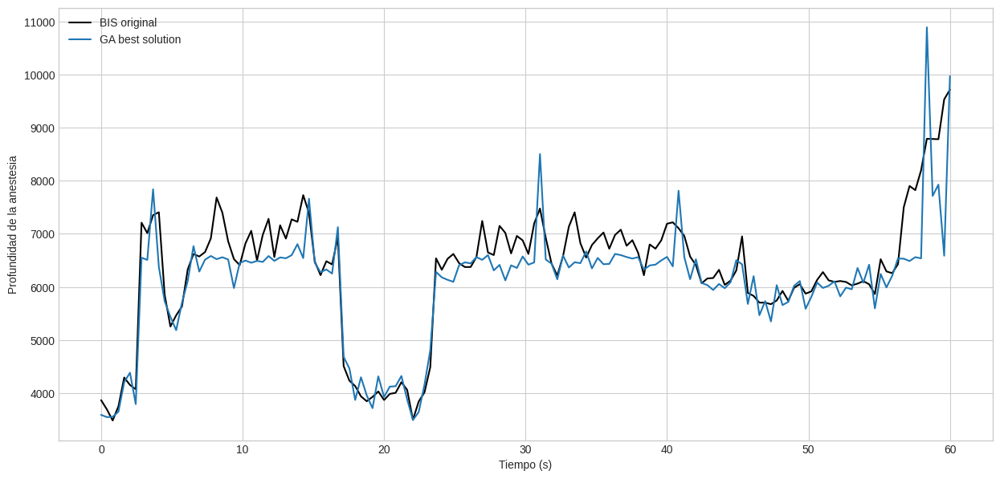

In [ ]:

target_sp_original = scaler.inverse_transform(target_sp.reshape(-1, 1)).flatten()
predicciones_originales = scaler.inverse_transform(ga_instance.best_solution()[0].reshape(-1, 1)).flatten() # Use scaler instead of target_sp
yhat = TargetVarScalerFit.inverse_transform(predicciones_originales.reshape(-1, 1)).T[0]
ytest=TargetVarScalerFit.inverse_transform(target_sp_original.reshape(-1, 1)).T[0]
wl = np.linspace(0,60, X.shape[1])
plt.figure(figsize=(15, 7))
plt.plot(wl, ytest, 'k', label="BIS original")
plt.plot(wl,yhat, label="GA best solution")
plt.xlabel("Tiempo (s)")
plt.ylabel("Profundidad de la anestesia")
plt.legend()
plt.show()

In [ ]:
#PREDECIR TODA LA SEÑAL

In [ ]:
X,y=acomodarDatosCNN3(lista,n_steps,df_test)
yhat = model.predict(X, verbose=0).T[0]
yhat = TargetVarScalerFit.inverse_transform(yhat.reshape(-1, 1)).T[0]
ytest = TargetVarScalerFit.inverse_transform(y.reshape(-1, 1)).T[0]    #hacer otra funcion para ivertir los datos
mse = mean_squared_error(ytest, yhat)
mae = mean_absolute_error(ytest, yhat)

#yhat = signal.savgol_filter(yhat, window_length=4, polyorder=2, mode="nearest")
#ytest= signal.savgol_filter(ytest, window_length=4, polyorder=2, mode="nearest")

plt.figure(figsize=(15, 7))
plt.subplot(211)
plt.title(f'Predicciones con mae:{mae}')
plt.plot(yhat,label='Predicción BIS')
plt.legend()
plt.subplot(211)
plt.plot(ytest, label='BIS original')
plt.legend()
cnn_predic_allpac_60=pd.DataFrame({
    'id_case':df_test['id_case'][n_steps-1:].values,  #verificar eso ver el id case y el valor de la bis con bis target
    'key':df_test['key'][n_steps-1:].values,
    'bis_prediction':yhat,
    'bis_target':ytest})
#cnn_predic_allpac_60.to_csv('cnn_predic_allpac_60.csv',index=False)

In [ ]:
pd.DataFrame(test_index_lista)
pd.DataFrame(test_index_lista).to_csv('test_index_lista_CNN.csv', index=False)

####Entrenando con el 70 y probando con el 20 lSTM

In [ ]:
from keras.layers import LSTM
from sklearn.preprocessing import StandardScaler

'''
lista=['est_min_ecg','est_median_ecg','est_mean_ecg','acorr_ecg_max','acorr_ecg_min','acorr_ecg_median',
 'acorr_ecg_mean','frac_pfd_ecg','frac_sfd_ecg','frac_psdslope_ecg','frac_dfd_ecg','frac_dfa_ecg','ent_klen_ecg',
 'acorr_hrv_max','acorr_hrv_min','frac_psdslope_hrv','frac_dfd_hrv','frac_h_hrv','ent_tsen_hrv',
 'nni_diff_min','sdann','pnn20','tinn_m','tinn','tri_index','lf_hf','sd_ratio','ellipse_area',
 'dfa_alpha1','dfa_alpha2','Modified_csi','sdi','est_var_hr','acorr_hr_max','acorr_hr_median']
'''


X=df.drop(columns=['est_median_bis','key','id_case'], axis=1)
y=df['est_median_bis'].values.reshape(-1, 1)
y_target,df_x,TargetVarScalerFit=escalar_datos(X,y,True,df)

#Por si hay un pacientes con muy pocos segmentos
id_unique=df_x['key'].unique().tolist()
conteo_valores = df_x['key'].value_counts()
id_unique = conteo_valores[conteo_valores < 6].index.tolist()
df_x = df_x[~df_x['key'].isin(id_unique)].reset_index(drop=True)
#Para dividir la señal en entrenar y testear
gss = GroupShuffleSplit(n_splits=1, test_size=0.1)
df_x2=df_x.copy()
df_x2['est_median_bis']=y_target['est_median_bis']
train_index, test_index = next(gss.split(df_x2[lista], df_x2['est_median_bis'], groups=df_x2['key']))
train_index_lista = df_x2.loc[train_index, 'key'].unique()
test_index_lista = df_x2.loc[test_index, 'key'].unique()



In [ ]:

n_steps = 3
for i in range(0, len(train_index_lista), 1):
    X, y = acomodarDatosCNN(df_x, lista, y_target, n_steps, i, train_index_lista)
    n_features = X.shape[2]
    if i == 0:
        model = Sequential()
        model.add(LSTM(100, activation='relu', input_shape=(n_steps, n_features)))
        model.add(Dense(100))
        model.add(Dense(100))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X, y, epochs=100, verbose=1)

joblib.dump(model, 'model_LSTM.pkl')


In [ ]:
#Para probar
maes=[]
for i in range(0, len(lista_de_listas),1):
  X,y,keys,ids=acomodarDatosCNN2(df_x,lista,y_target,n_steps,lista_de_listas[i])
  yhat = model.predict(X, verbose=0).T[0]
  yhat = TargetVarScalerFit.inverse_transform(yhat.reshape(-1, 1)).T[0]
  ytest = TargetVarScalerFit.inverse_transform(y.reshape(-1, 1)).T[0]    #hacer otra funcion para ivertir los datos
  mse = mean_squared_error(ytest, yhat)
  mae = mean_absolute_error(ytest, yhat)
  maes.append(mae)   #guardar es el test_index_lista y los mae en dataframe
np.mean(maes)

7.5480209328112124

In [ ]:
selected_test_idcase=[]
selected_test_idcase.append(np.random.choice(test_index_lista))
for i in range(0,len(test_index_lista),1):
  X,y=acomodarDatosCNN(df_x,lista,y_target,n_steps,i,test_index_lista);
  yhat = model.predict(X, verbose=0).T[0]
  yhat = TargetVarScalerFit.inverse_transform(yhat.reshape(-1, 1)).T[0]
  ytest = TargetVarScalerFit.inverse_transform(y.reshape(-1, 1)).T[0]    #hacer otra funcion para ivertir los datos
  mse = mean_squared_error(ytest, yhat)
  mae = mean_absolute_error(ytest, yhat)


  mse = mean_squared_error(yhat, ytest)
  mae = mean_absolute_error(yhat, ytest)
  yhat = signal.savgol_filter(yhat, window_length=7, polyorder=2, mode="nearest")
  ytest= signal.savgol_filter(ytest, window_length=7, polyorder=2, mode="nearest")

  plt.figure(figsize=(15, 7))
  plt.subplot(211)
  plt.title(f'{test_index_lista[i]} con MAE={mae}')
  plt.plot(yhat,label='Predicción BIS')
  plt.legend()
  plt.subplot(211)
  plt.plot(ytest, label='BIS original')
  plt.legend()



#### algoritmos

In [ ]:
!pip install catboost

In [ ]:
from sklearn.linear_model import SGDRegressor
import pandas as pd
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error
from scipy import signal



In [ ]:
lista=['est_max_ecg','est_min_ecg','est_median_ecg','est_mean_ecg','est_var_ecg','acorr_ecg_max','acorr_ecg_min',
      'acorr_ecg_median',
       'acorr_ecg_mean','acorr_ecg_var','frac_psdslope_ecg','frac_dfd_ecg','frac_dfa_ecg','ent_tsen_ecg',
       'ent_svden_ecg','ent_klen_ecg','ssc_ecg','est_var_hrv','acorr_hrv_max','acorr_hrv_min','frac_psdslope_hrv',
        'frac_dfd_hrv','frac_h_hrv','ent_shanen_hrv','ent_powen_hrv','nni_diff_min','sdnn_index','sdann',
        'tinn_m','tinn','tri_index','hf','lf_hf','sd_ratio','ellipse_area','dfa_alpha2',
        'sdi','est_var_hr','acorr_hr_max','acorr_hr_median','ent_sampen_hr','ssc_hr']

df=df.iloc[0:10000]
X=df.drop(columns=['est_median_bis','key','id_case'], axis=1)
y=df['est_median_bis'].values.reshape(-1, 1)
y_target,df_x,TargetVarScalerFit=escalar_datos(X,y,False,df)

id_unique=df_x['key'].unique().tolist()
conteo_valores = df_x['key'].value_counts()
id_unique = conteo_valores[conteo_valores < 6].index.tolist()
df_x = df_x[~df_x['key'].isin(id_unique)].reset_index(drop=True)

n=2 #----------------Pacientes para
df_x2=df_x.copy()
df_x2['est_median_bis']=y_target['est_median_bis']
id_unique=df_x2['id_case'].unique().tolist()
df_train=df_x2[df_x2['id_case'].isin(id_unique[:len(id_unique)-n])]
df_test=df_x2[df_x2['id_case'].isin(id_unique[len(id_unique)-n:])]

train_index_lista=df_train['key'].unique().tolist()
test_index_lista=df_test['key'].unique().tolist()


from catboost import CatBoostRegressor
regr = CatBoostRegressor(iterations=10, learning_rate=0.1, depth=1)
random_state=5
for i in range(0,len(train_index_lista),1):
  data=df_x.loc[df_x['key']==train_index_lista[i]].reset_index(drop=True)
  X=data[lista]
  y=y_target.loc[y_target['key']==train_index_lista[i]].reset_index(drop=True)
  y=y['est_median_bis'].values.T
  if i == 0:
      regr.fit(X, y)
  else:
      regr.fit(X, y, init_model=regr)
'''
regr = CatBoostRegressor(iterations=2,
                          learning_rate=1,
                          depth=2)
regr.fit(X_trainset, y_trainset)
'''
#joblib.dump(model, 'model_60_ExtraTree.pkl')

[['1114_0', '1114_1', '1114_2', '1114_3', '1114_4'], ['1175_0']]


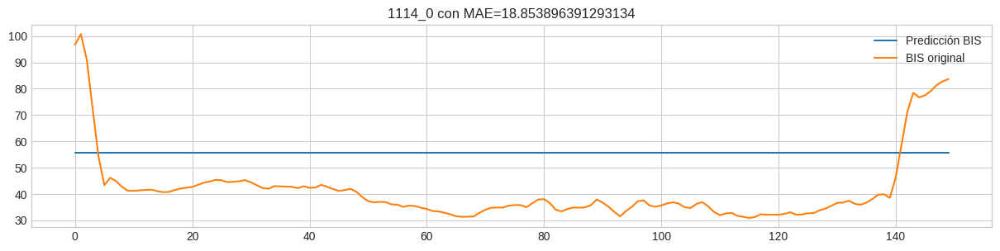

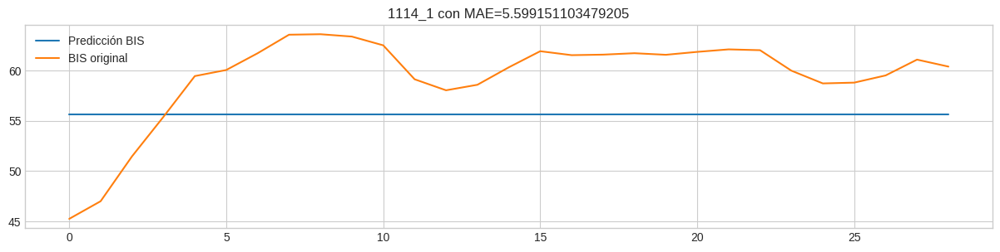

In [ ]:
prefijos = df_test['id_case'].unique().tolist()
lista_de_listas = []
for prefijo in prefijos:
    sublista = [elem for elem in test_index_lista if elem.startswith(str(prefijo))]
    lista_de_listas.append(sublista)
print(lista_de_listas)

regr=booster

#Probando los pacientes
maes=[]
for i in range(0,len(lista_de_listas),1):
  X=df_x[df_x['key'].isin(lista_de_listas[i])][lista]
  y=y_target[y_target['key'].isin(lista_de_listas[i])]
  y=y['est_median_bis'].values.T
  yh=regr.predict(X)

  #yh=TargetVarScalerFit.inverse_transform(yh.reshape(-1, 1))
  #y=TargetVarScalerFit.inverse_transform(y.reshape(-1, 1))

  mse = mean_squared_error(yh, y)
  mae = mean_absolute_error(yh, y)
  maes.append(mae)

  yhat = signal.savgol_filter(yh, window_length=6, polyorder=2, mode="nearest")
  ytest= signal.savgol_filter(y, window_length=6, polyorder=2, mode="nearest")

  plt.figure(figsize=(15, 7))
  plt.subplot(211)
  plt.title(f'{test_index_lista[i]} con MAE={mae}')
  plt.plot(yhat,label='Predicción BIS')
  plt.legend()
  plt.subplot(211)
  plt.plot(ytest, label='BIS original')
  plt.legend()

In [ ]:
#Importancia de las caracterisicas

feature_importances = pd.Series(regr.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(35,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)

plt.xlabel('Features',fontsize=20,fontweight='bold')
plt.ylabel('Importance',fontsize=20,fontweight='bold')
#plt.title('Importancia de características')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')
plt.show()

### version anterior

In [ ]:
lista=[
 'preop_dm',
 'intraop_ppf',
 'intraop_ftn',
 'intraop_rocu',
 'intraop_eph',
 'intraop_phe',
 'est_max_ecg',
 'est_min_ecg',
 'est_median_ecg',
 'est_mean_ecg',
 'acorr_ecg_max',
 'acorr_ecg_min',
 'acorr_ecg_median',
 'acorr_ecg_mean',
 'frac_pfd_ecg',
 'frac_sfd_ecg',
 'frac_psdslope_ecg',
 'frac_dfd_ecg',
 'frac_dfa_ecg',
 'ent_klen_ecg',
 'acorr_hrv_max',
 'acorr_hrv_min',
 'frac_psdslope_hrv',
 'frac_dfd_hrv',
 'frac_h_hrv',
 'ent_tsen_hrv',
 'nni_diff_min',
 'sdann',
 'pnn20',
 'tinn_m',
 'tinn',
 'tri_index',
 'lf_hf',
 'sd_ratio',
 'ellipse_area',
 'dfa_alpha1',
 'dfa_alpha2',
 'Modified_csi',
 'sdi',
 'est_var_hr',
 'acorr_hr_max',
 'acorr_hr_median','est_median_bis']

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_x = df.drop('key', axis=1)
df_x = pd.DataFrame(scaler.fit_transform(df_x), columns=df_x.columns)
df_x['key'] = df['key']

# split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the dataset
		if end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)

def acomodarDatosCNN(df_x,columnas,n_steps,i,index):
	data=df_x.loc[df_x['key']==index[i]].reset_index(drop=True)
	X=data[columnas]
	y=data['est_median_bis']
	features=X.values.T
	target=y.values.T
	reshaped_features = [array.reshape((len(array), 1)) for array in features]  # Aplicar reshape a cada array dentro del array de arrays
	reshaped_target = target.reshape((len(target), 1))
	dataset = np.hstack(reshaped_features + [reshaped_target]) # Concatenar horizontalmente todos los arrays
	X, y = split_sequences(dataset, n_steps)
	return X,y




#Por si hay un pacientes con muy pocos segmentos
id_unique=df_x['key'].unique().tolist()
conteo_valores = df_x['key'].value_counts()
id_unique = conteo_valores[conteo_valores < 6].index.tolist()
df_x = df_x[~df_x['key'].isin(id_unique)].reset_index(drop=True)

#Para dividir la señal en entrenar y testear
gss = GroupShuffleSplit(n_splits=1, test_size=0.2)
train_index, test_index = next(gss.split(df_x[lista], df_x['est_median_bis'], groups=df_x['key']))
train_index_lista = df_x.loc[train_index, 'key'].unique()
test_index_lista = df_x.loc[test_index, 'key'].unique()
#selected_test_idcase = np.random.choice(test_index_lista)
#selected_test_idcase=1401
lista_results_test=[]

#Para entrenar

n_steps = 3
for i in range(0,len(train_index_lista),1):
  X,y=acomodarDatosCNN(df_x,lista,n_steps,i,train_index_lista);
  n_features = X.shape[2]
  if i==0:
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, n_features)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(50, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')  #Adagrad
  model.fit(X, y, epochs=500, verbose=1)
joblib.dump(model, 'model.pkl')

#Para probar
maes=[]
for i in range(0,len(test_index_lista),1):
  X,y=acomodarDatosCNN(df_x,lista,n_steps,i,test_index_lista);
  yhat = model.predict(X, verbose=0).T[0]
  mse = mean_squared_error(y, yhat)
  mae = mean_absolute_error(y, yhat)
  maes.append(mae)   #guardar es el test_index_lista y los mae en dataframe


## **Funciones**

In [ ]:
def calculateVIF(df_x):
    var_predictoras_df=df_x
    var_pred_labels = list(var_predictoras_df.columns)
    num_var_pred = len(var_pred_labels)

    lr_model = LinearRegression()

    result = pd.DataFrame(index = ['VIF'], columns = var_pred_labels)
    result = result.fillna(0)

    for ite in range(num_var_pred):
        x_features = var_pred_labels[:]
        y_feature = var_pred_labels[ite]
        x_features.remove(y_feature)

        x = var_predictoras_df[x_features];
        y = var_predictoras_df[y_feature];

        lr_model.fit(var_predictoras_df[x_features], var_predictoras_df[y_feature])

        result[y_feature] = 1/(1 - lr_model.score(var_predictoras_df[x_features], var_predictoras_df[y_feature]))
        #print(ite)
    return result


#calculateVIF(df_x.copy(deep = True)).T;
def selectDataUsingVIF(var_predictoras_df, max_VIF = 5):

  result = var_predictoras_df.copy(deep = True)

  VIF = calculateVIF(result)

  while VIF.values.max() > max_VIF:
    col_max = np.where(VIF == VIF.values.max())[1][0]
    features = list(result.columns)
    print(features[col_max])
    features.remove(features[col_max])
    result = result[features]
    VIF = calculateVIF(result)
    print(VIF.values.max())
  return result


def z_score(columna_actual, umbral):
      datos_limpios = []
      media = np.mean(columna_actual)
      desviacion_tipica = np.std(columna_actual)
      c=0
      outlier=[]
      for i in columna_actual:
          dato = abs(abs(i)- abs(media))/desviacion_tipica

          if dato < umbral:
              datos_limpios.append(i)
          else:
            #c=c+1
            outlier.append(i)

      return np.array(datos_limpios), np.array(outlier)

## **Main**

In [ ]:
df_1=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/PD/windows_60/df_60.csv")
%cd "/content/drive/My Drive/Colab Notebooks/PD"

df=df_1.copy()
df = df.drop(['est_mean_geom_ecg','subjectid','casestart','caseend','anestart','aneend','opstart','opend',
              'est_max_bis','est_min_bis','est_median_bis','est_mean_bis','est_std_bis',
              'est_var_bis','est_mean_geom_bis','iv2','aline1'], axis=1)
df.rename(columns={'ind': 'id_case'}, inplace=True)

#IMPUTAR LOS NAN EN LAS COLUMNAS CATEGORICAS
columns_to_replace_nan = ['airway']
for column in columns_to_replace_nan:
    df[column].fillna('No registrado', inplace=True)

#IMPUTAR LAS NAN EN LOS ATOS NÚMERICOS
columns_to_replace_nan_or_inf = ['frac_h_hrv',
       'frac_dfa_hrv', 'ent_diffen_hrv', 'sdnn_index', 'sdann', 'dfa_alpha1',
       'dfa_alpha2', 'frac_h_hr', 'frac_dfa_hr']



for j in columns_to_replace_nan_or_inf:
  nulos_por_columna=df[j].isnull().sum()
  inf_count_en_columna = df[j].isin([np.inf, -np.inf]).sum()

  if nulos_por_columna>0:
    filas_con_nan = np.asarray((df[df[j].isnull()]).index)
    for i in filas_con_nan:
      id=df['id_case'][i]
      valores = np.asarray(df[df['id_case'] == id][j])
      _mean=np.nanmedian(valores)
      df[j][i]=_mean

  if inf_count_en_columna>0:
    filas_con_inf = np.asarray(df[df[j].apply(np.isinf)].index)
    for i in filas_con_inf:
      id=df['id_case'][i]
      valores= np.asarray(df[df['id_case'] == id][j])
      _mean=np.median(valores[np.isfinite(valores)])
      df[j][i]=_mean

#CORRIGIENDO LA CARDINALIDAD
df = df.drop(['department','optype','ane_type','preop_ecg','preop_pft','airway'], axis=1)

#CODIFICAR VARIABLES CATEGORICAS CON OneHotEncoding
codificar='si'
if codificar =='si':
  df['dx'] = df['dx'].str.strip() #elimina espacios al principio y al final
  df['dx'].value_counts()
  df_encoded = pd.get_dummies(df, columns=['sex','dx','opname','approach','position','iv1'], drop_first=True)
else:
  df_encoded=df.copy()

df_x=df_encoded
df_x=df_x.drop(columns=['id_case'], axis=1)
df_x_orginal=df_x
#df_x=df_x.drop(columns=[['intraop_ppf','intraop_ftn','intraop_rocu','intraop_eph','intraop_phe']])

#ELIMININAR COLUMNAS CON VARIANZA CERO
varianza_cero=df_x.select_dtypes(include=['float64','int64']).var()
low_variance_features = varianza_cero[varianza_cero == 0].index
df_x.drop(columns=low_variance_features, inplace=True)



,age,height,weight,bmi,intraop_ppf,intraop_ftn,intraop_rocu,intraop_eph,intraop_phe,est_max_ecg,...,opname_Transanal excision,opname_Varicocelectomy,opname_anterior resection,opname_subtotal colectomy,approach_Videoscopic,position_Supine,iv1_Left forearm,iv1_Left hand,iv1_Right forearm,iv1_Right hand
0,35,167.0,58.2,20.9,0,100,50,0,0,2.149438,...,False,False,False,False,True,True,False,False,True,False
1,35,167.0,58.2,20.9,0,100,50,0,0,6.095964,...,False,False,False,False,True,True,False,False,True,False
2,35,167.0,58.2,20.9,0,100,50,0,0,3.470628,...,False,False,False,False,True,True,False,False,True,False
3,35,167.0,58.2,20.9,0,100,50,0,0,2.043409,...,False,False,False,False,True,True,False,False,True,False
4,35,167.0,58.2,20.9,0,100,50,0,0,2.025936,...,False,False,False,False,True,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17992,58,173.3,76.4,25.4,120,0,90,0,0,0.675529,...,False,False,False,False,True,False,True,False,False,False
17993,58,173.3,76.4,25.4,120,0,90,0,0,0.666034,...,False,False,False,False,True,False,True,False,False,False
17994,58,173.3,76.4,25.4,120,0,90,0,0,0.689188,...,False,False,False,False,True,False,True,False,False,False
17995,58,173.3,76.4,25.4,120,0,90,0,0,0.634069,...,False,False,False,False,True,False,True,False,False,False


In [ ]:
df_x

In [ ]:

#DETECTOR DE MULTICOLINEALIDAD
from sklearn.linear_model import LinearRegression
df_x=df_x.select_dtypes(include=['float64','int64'])  #excluir esos de la multicolinealidad los enteros, ver como funiona el moelo sino ponerlos y solo excluir medicamentos
VIF_orig = calculateVIF(df_x.copy(deep = True)).columns.to_list()
VIF_less_th_5 = calculateVIF(selectDataUsingVIF(df_x)).columns.to_list() #lista e columnas
[feat for feat in VIF_orig if feat not in VIF_less_th_5]

In [ ]:
#LISTA DE COLUMNAS CONSIDERANDO LOS VALORES FLOAT Y LOS ENTEROS (medicamentos, datos demograficos)

VIF_less_th_5=['age',
 'height',
 'bmi',
 'intraop_ppf',
 'intraop_ftn',
 'intraop_rocu',
 'intraop_eph',
 'intraop_phe',
 'est_median_ecg',
 'est_mean_ecg',
 'est_var_ecg',
 'acorr_ecg_max',
 'acorr_ecg_min',
 'acorr_ecg_median',
 'acorr_ecg_mean',
 'acorr_ecg_var',
 'frac_pfd_ecg',
 'frac_sfd_ecg',
 'frac_psdslope_ecg',
 'frac_dfd_ecg',
 'frac_dfa_ecg',
 'ent_shanen_ecg',
 'ent_tsen_ecg',
 'ent_svden_ecg',
 'ent_klen_ecg',
 'zc_ecg',
 'acorr_hrv_max',
 'acorr_hrv_min',
 'frac_psdslope_hrv',
 'frac_dfd_hrv',
 'frac_h_hrv',
 'nni_diff_min',
 'sdann',
 'pnn50',
 'tinn_m',
 'tinn',
 'tri_index',
 'lf',
 'hf',
 'lf_hf',
 'sd_ratio',
 'ellipse_area',
 'dfa_alpha1',
 'dfa_alpha2',
 'sdi',
 'est_max_hr',
 'acorr_hr_max',
 'acorr_hr_median',
 'ent_tsen_hr',
 'ent_sampen_hr']
len(VIF_less_th_5)

#LISTA DE COLUMNAS CONSIDERANO SOLO ENTEROS

50

In [ ]:
#QUITAR OUTLIERS
analizar_columnas=df_x[VIF_less_th_5]
con=0
outliers_info = pd.DataFrame(columns=['Columna', 'Cantidad_Outliers'])
for columna in analizar_columnas:
  columna_actual = df_x[columna].values
  datos_limpios,outliers=z_score(columna_actual, 3)

  if len(outliers)!=0:
    indices_outliers= df_x[df_x[columna].isin(outliers)].index
    if con!=0:
        x = np.concatenate((x, indices_outliers))
    if con==0:
        x=indices_outliers
    con=con+1
  nueva_fila = pd.DataFrame({'Columna': [columna], 'Cantidad_Outliers': [len(outliers)]})
  outliers_info = pd.concat([outliers_info, nueva_fila], ignore_index=True)
  #outliers_info = outliers_info.append({'Columna': columna, 'Cantidad_Outliers': len(outliers)}, ignore_index=True);
x = list(set(x)) #eliminar los duplicados

df_x=df_x[VIF_less_th_5]
#df_int=df_x_orginal.select_dtypes(include=['int64']).columns.values.tolist()
df_catego=df_x_orginal.select_dtypes(include=['uint8']).columns.values.tolist()

#df_x[df_int]=df_x_orginal[df_int] #agrego los enteros
df_x[df_catego]=df_x_orginal[df_catego] #agrego categoricos
df_x['est_median_bis']=df_1['est_median_bis'] #agrego la variable objetivo
df_x['id_case']=df_encoded['id_case']


df_x=df_x.drop(df_x.index[x])  #elimino outliers
df_x.reset_index(drop=True, inplace=True)

In [ ]:
pd.DataFrame(x).value_counts()
outliers_info.sort_values(by='Cantidad_Outliers', ascending=False).head(20)


In [ ]:
df_x

##**Selección y análisis de caracteristicas**

###Identificando las carcateristicas más importantes

####Selección de caracteristicas: Usando correlación o información mutua

In [ ]:
# example of correlation feature selection for numerical data
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import mutual_info_regression
from matplotlib import pyplot

def select_features(X_trainset, y_trainset, X_testset):
 # configure to select all features
 fs = SelectKBest(score_func=mutual_info_regression, k='all')   #mutual_info_regression #CAMBIAR AQUIIII
 # learn relationship from training data
 fs.fit(X_trainset, y_trainset)
 # transform train input data
 X_train_fs = fs.transform(X_trainset)
 # transform test input data
 X_test_fs = fs.transform(X_testset)
 return X_train_fs, X_test_fs, fs

# load the dataset
X=(df_x.drop('est_median_bis','id_case', axis=1))
y=df_x['est_median_bis']
# split into train and test sets
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
#pacientes=X_testset['id_case'].unique()
#cantidad_w=X_testset['id_case'].value_counts()
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_trainset, y_trainset, X_testset)
# what are scores for the features
for i in range(len(fs.scores_)):
 print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

'''
X_testset2=X_testset[X_testset['id_case']==2418.0]
indices_filas_cumplen_condicion = X_testset.loc[X_testset['id_case'] == 2418.0].index
y_testset2 = y_testset.loc[indices_filas_cumplen_condicion]
print('Train', X_trainset.shape, y_trainset.shape)
print('Test', X_testset.shape, y_testset.shape)
'''

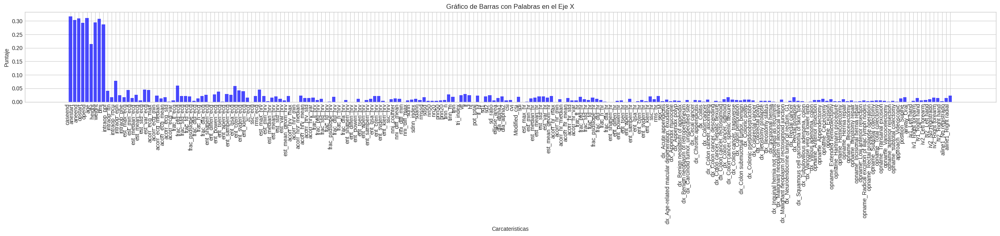

In [ ]:
plt.figure(figsize=(25, 6))
plt.bar(X_trainset.columns, fs.scores_, color='blue', alpha=0.7)
plt.title('Gráfico de Barras con Palabras en el Eje X')
plt.xlabel('Carcateristicas')
plt.ylabel('Puntaje')
plt.xticks(rotation=90, ha='right')  # Rotar las etiquetas del eje x para mayor legibilidad
plt.tight_layout()  # Ajustar el diseño para evitar cortar las etiquetas
plt.show()

####Ganancia e información selección e carcateristicas

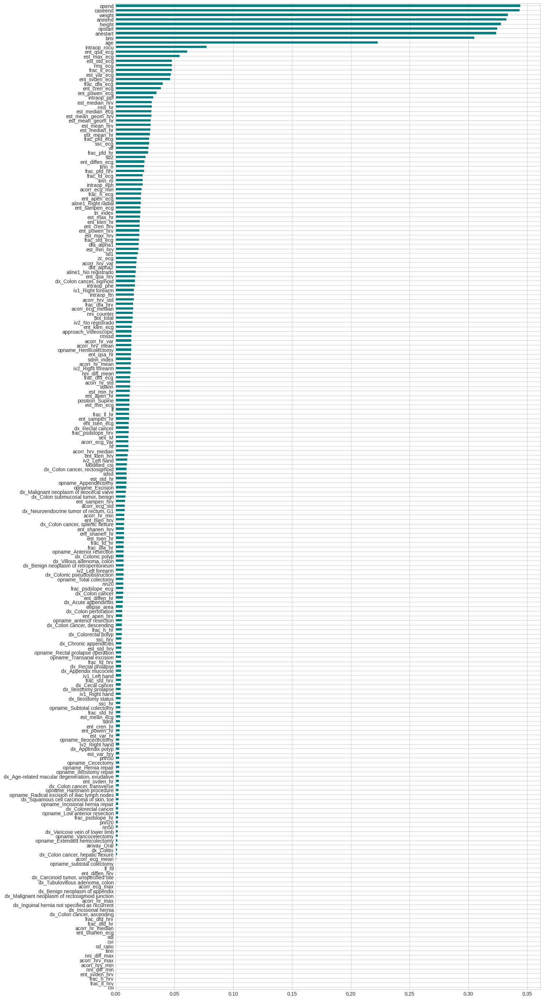

In [ ]:
from sklearn.feature_selection import mutual_info_regression

# load the dataset
X=(df_x.drop('est_median_bis','id_case', axis=1))
y=df_x['est_median_bis']
importances = mutual_info_regression(X, y)
feat_importances = pd.Series(importances, index=X.columns)
feat_importances_sorted = feat_importances.sort_values(ascending=True)
plt.figure(figsize=(15, 35))
feat_importances_sorted.plot(kind='barh', color='teal')
plt.show()

In [ ]:
(feat_importances.sort_values(ascending=False)).index.tolist()

####Modelo con todas las caracteristicas

In [ ]:
# evaluation of a model using all input features
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error

# load the dataset
X=(df_x.drop('est_median_bis','id_case', axis=1))
y=df_x['est_median_bis']
# split into train and test sets
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
# fit the model
model = LinearRegression()
model.fit(X_trainset, y_trainset)
# evaluate the model
yhat = model.predict(X_testset)
# evaluate predictions
mae = mean_absolute_error(y_testset, yhat)
print('MAE: %.3f' % mae)

MAE: 7.346


####Modelo con menos caracteristicas

In [ ]:
# evaluation of a model using 88 features chosen with correlation
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error

# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select a subset of features
	fs = SelectKBest(score_func=mutual_info_regression, k=80)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

# load the dataset
X=(df_x.drop('est_median_bis','id_case', axis=1))
y=df_x['est_median_bis']
# split into train and test sets
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_trainset, y_trainset, X_testset)
# fit the model
model = LinearRegression()
model.fit(X_train_fs, y_trainset)
# evaluate the model
yhat = model.predict(X_test_fs)
# evaluate predictions
mae = mean_absolute_error(y_testset, yhat)
print('MAE: %.3f' % mae)

MAE: 8.040


##**Ranking de caracteristicas**

https://www.analyticsvidhya.com/blog/2020/10/a-comprehensive-guide-to-feature-selection-using-wrapper-methods-in-python/

In [ ]:
# evaluation of a model using all input features
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error

In [ ]:
!pip install statsmodels
import statsmodels.api as sm

In [ ]:
def forward_selection(data, target, significance_level=0.05):
    initial_features = data.columns.tolist()
    best_features = []
    while (len(initial_features)>0):
        remaining_features = list(set(initial_features)-set(best_features))
        new_pval = pd.Series(index=remaining_features)
        for new_column in remaining_features:
            model = sm.OLS(target, sm.add_constant(data[best_features+[new_column]])).fit()
            new_pval[new_column] = model.pvalues[new_column]
        min_p_value = new_pval.min()
        if(min_p_value<significance_level):
            best_features.append(new_pval.idxmin())
        else:
            break
    return best_features

forward_selection(X, y)

###Gradient Boosting Regresor

In [ ]:

'''
y=df_x[['est_median_bis','id_case']]
X = df_x.drop(['est_median_bis'], axis=1)  #para comprobar que solo este un id_case unico en los datos de test
X_test['id_case'].value_counts()

#verifico que no este en los case_id de entrenamiento
4257 in X_train['id_case'].values
'''



False

MAE: 5.464195202578651
MSE: 61.56380690626537
R-squared: 0.5121466026764846
Correlación: 0.7209033428844009


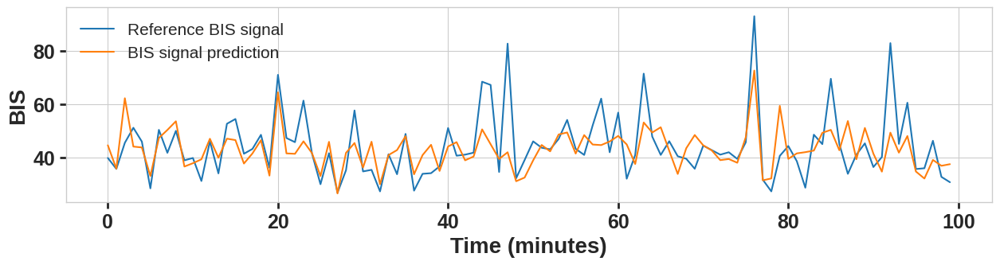

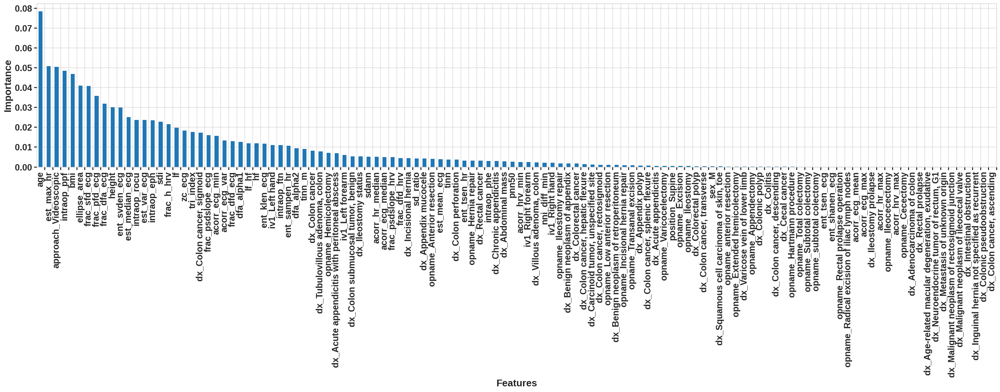

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
random_state=0

X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3,random_state=random_state)
reg = GradientBoostingRegressor(n_estimators=500,random_state=random_state)
modelo=reg.fit(X_trainset, y_trainset)
y_rest=modelo.predict(X_testset)

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:100].values,'-', label='Reference BIS signal ')
plt.legend(fontsize=15,loc='upper left')
plt.subplot(211)
plt.plot(y_rest[0:100],'-',label='BIS signal prediction')
plt.legend(fontsize=15,loc='upper left')
plt.xlabel('Time (minutes)',fontsize=20,fontweight='bold')
plt.ylabel('BIS',fontsize=20,fontweight='bold')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')

mse = mean_squared_error(y_testset, y_rest)
mae = mean_absolute_error(y_testset, y_rest)
r2 = r2_score(y_testset, y_rest)
correlation_coef, p_value = pearsonr(y_testset, y_rest)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')



feature_importances = pd.Series(modelo.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(35,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)

plt.xlabel('Features',fontsize=20,fontweight='bold')
plt.ylabel('Importance',fontsize=20,fontweight='bold')
#plt.title('Importancia de características')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')
plt.show()

In [ ]:
valores=feature_importances.values.tolist()
c=0
cont=0

while c<0.94:
  c=valores[cont]+c
  cont=cont+1
columnas=feature_importances.index.tolist()
print(columnas[cont])

est_mean_ecg


In [ ]:
feature_importances.index.tolist()

['age',
 'est_max_hr',
 'approach_Videoscopic',
 'intraop_ppf',
 'bmi',
 'ellipse_area',
 'frac_sfd_ecg',
 'frac_pfd_ecg',
 'frac_dfa_ecg',
 'height',
 'ent_svden_ecg',
 'est_median_ecg',
 'intraop_rocu',
 'est_var_ecg',
 'intraop_eph',
 'sdi',
 'frac_h_hrv',
 'lf',
 'zc_ecg',
 'tri_index',
 'dx_Colon cancer, sigmoid',
 'frac_psdslope_ecg',
 'acorr_ecg_min',
 'acorr_ecg_var',
 'frac_dfd_ecg',
 'dfa_alpha1',
 'lf_hf',
 'hf',
 'ent_klen_ecg',
 'iv1_Left hand',
 'intraop_ftn',
 'ent_sampen_hr',
 'dfa_alpha2',
 'tinn_m',
 'dx_Colon cancer',
 'dx_Tubulovillous adenoma, colon',
 'opname_Hemicolectomy',
 'dx_Acute appendicitis with peritoneal abscess',
 'iv1_Left forearm',
 'dx_Colon submucosal tumor, benign',
 'dx_Ileostomy status',
 'sdann',
 'acorr_hr_median',
 'acorr_ecg_median',
 'frac_psdslope_hrv',
 'frac_dfd_hrv',
 'dx_Incisional hernia',
 'sd_ratio',
 'dx_Appendix mucocele',
 'opname_Anterior resection',
 'est_mean_ecg',
 'tinn',
 'dx_Colon perforation',
 'ent_tsen_hr',
 'opname_Hern

MAE: 5.645903690012168
MSE: 68.7979442678419
R-squared: 0.45618236408073576
Correlación: 0.6755298596223331


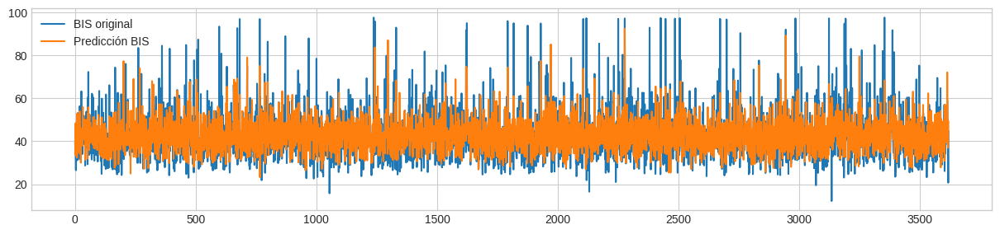

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
lista=['age',
 'est_max_hr',
 'approach_Videoscopic',
 'intraop_ppf',
 'bmi',
 'ellipse_area',
 'frac_sfd_ecg',
 'frac_pfd_ecg',
 'frac_dfa_ecg',
 'height',
 'ent_svden_ecg',
 'est_median_ecg',
 'intraop_rocu',
 'est_var_ecg',
 'intraop_eph',
 'sdi',
 'frac_h_hrv',
 'lf',
 'zc_ecg',
 'tri_index',
 'dx_Colon cancer, sigmoid',
 'frac_psdslope_ecg',
 'acorr_ecg_min',
 'acorr_ecg_var',
 'frac_dfd_ecg',
 'dfa_alpha1',
 'lf_hf',
 'hf',
 'ent_klen_ecg',
 'iv1_Left hand',
 'intraop_ftn',
 'ent_sampen_hr',
 'dfa_alpha2',
 'tinn_m',
 'dx_Colon cancer',
 'dx_Tubulovillous adenoma, colon',
 'opname_Hemicolectomy',
 'dx_Acute appendicitis with peritoneal abscess',
 'iv1_Left forearm',
 'dx_Colon submucosal tumor, benign',
 'dx_Ileostomy status',
 'sdann',
 'acorr_hr_median',
 'acorr_ecg_median',
 'frac_psdslope_hrv',
 'frac_dfd_hrv',
 'dx_Incisional hernia',
 'sd_ratio',
 'dx_Appendix mucocele',
 'opname_Anterior resection',
 'est_mean_ecg']


y=df_x['est_median_bis']
X=df_x[lista]
random_state=5
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3,random_state=random_state)
reg = GradientBoostingRegressor(n_estimators=500,random_state=random_state)
modelo=reg.fit(X_trainset, y_trainset)
y_rest=modelo.predict(X_testset)

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset.values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(y_rest,'-',label='Predicción BIS')
plt.legend()


mse = mean_squared_error(y_testset, y_rest)
mae = mean_absolute_error(y_testset, y_rest)
r2 = r2_score(y_testset, y_rest)
correlation_coef, p_value = pearsonr(y_testset, y_rest)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')



Un paciente

3395.0


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MAE: 12.774646521781252
MSE: 354.6118183766229
R-squared: -0.24499318560222294
Correlación: -0.09325044739697003


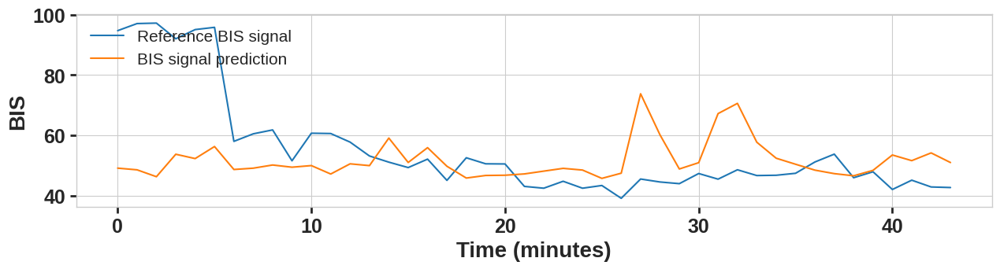

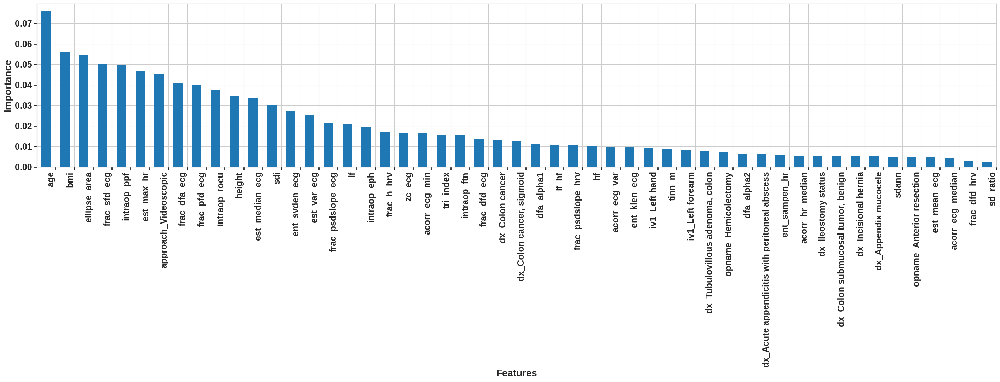

In [ ]:
#TEST CON UN PACIENTE
from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler

y=df_x[['est_median_bis']]
X = df_x[lista]
gss = GroupShuffleSplit(n_splits=1, test_size=0.2)
train_index, test_index = next(gss.split(X, y, groups=df_x['id_case']))
unique_test_idcases = df_x.loc[test_index, 'id_case'].unique()
selected_test_idcase = np.random.choice(unique_test_idcases)
#selected_test_idcase=616
print(selected_test_idcase)
X_testset = X.loc[df_x['id_case'] == selected_test_idcase]
y_testset = y.loc[df_x['id_case'] == selected_test_idcase]
X_trainset = X.loc[df_x['id_case'] != selected_test_idcase]
y_trainset = y.loc[df_x['id_case'] != selected_test_idcase]
scaler = StandardScaler()
X_trainset = scaler.fit_transform(X_trainset)
X_testset = scaler.transform(X_testset)
reg = GradientBoostingRegressor(n_estimators=500,random_state=random_state)
modelo=reg.fit(X_trainset, y_trainset)
ypred=modelo.predict(X_testset)

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset['est_median_bis'].values,'-', label='Reference BIS signal ')
plt.legend(fontsize=15,loc='upper left')
plt.subplot(211)
plt.plot(ypred,'-',label='BIS signal prediction')
plt.legend(fontsize=15,loc='upper left')
plt.xlabel('Time (minutes)',fontsize=20,fontweight='bold')
plt.ylabel('BIS',fontsize=20,fontweight='bold')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')

mse = mean_squared_error(y_testset['est_median_bis'].values, ypred)
mae = mean_absolute_error(y_testset['est_median_bis'].values, ypred)
r2 = r2_score(y_testset['est_median_bis'].values, ypred)
correlation_coef, p_value = pearsonr(y_testset['est_median_bis'].values, ypred)
print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

feature_importances = pd.Series(modelo.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(35,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')
ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)



plt.xlabel('Features',fontsize=20,fontweight='bold')
plt.ylabel('Importance',fontsize=20,fontweight='bold')
#plt.title('Importancia de características')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')
plt.show()

###XGBRegressor

MAE: 5.066102362020074
MSE: 60.44295343646339
R-squared: 0.5363890342461624
Correlación: 0.7325443961331723


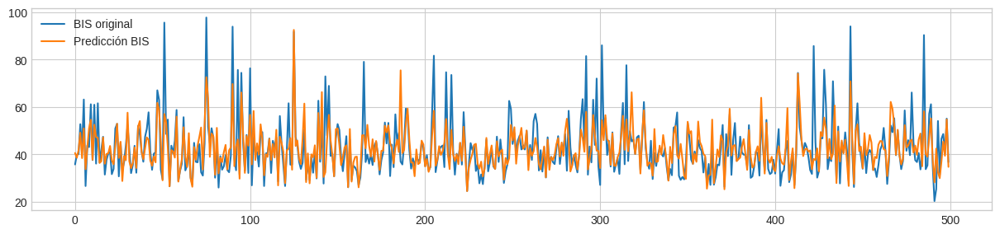

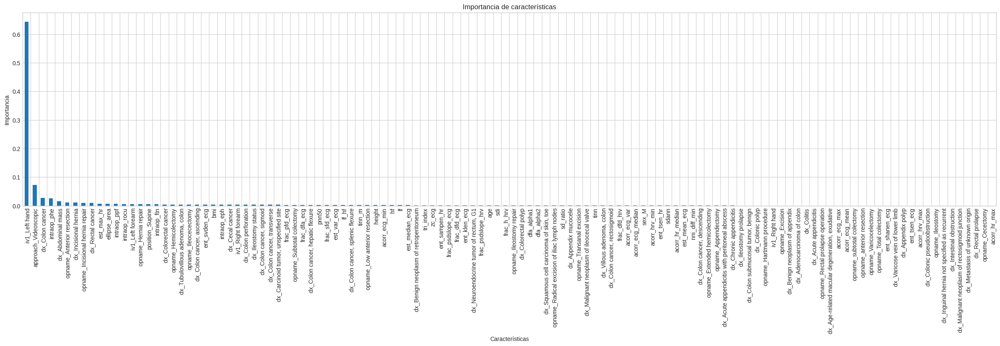

['iv1_Left hand', 'approach_Videoscopic', 'dx_Colon cancer', 'intraop_phe', 'dx_Abdominal mass', 'opname_Anterior resection', 'dx_Incisional hernia', 'opname_Incisional hernia repair', 'dx_Rectal cancer', 'est_max_hr', 'ellipse_area', 'intraop_ppf', 'intraop_rocu', 'iv1_Left forearm', 'opname_Hernia repair', 'position_Supine', 'intraop_ftn', 'dx_Colorectal cancer', 'opname_Hemicolectomy', 'dx_Tubulovillous adenoma, colon', 'opname_Ileocecectomy', 'dx_Colon cancer, ascending', 'ent_svden_ecg', 'bmi', 'intraop_eph', 'dx_Cecal cancer', 'iv1_Right forearm', 'dx_Colon perforation', 'dx_Ileostomy status', 'dx_Colon cancer, sigmoid', 'dx_Colon cancer, transverse', 'dx_Carcinoid tumor, unspecified site', 'frac_pfd_ecg', 'opname_Subtotal colectomy', 'frac_dfa_ecg', 'dx_Colon cancer, hepatic flexure', 'pnn50', 'frac_sfd_ecg', 'est_var_ecg', 'lf_hf', 'dx_Colon cancer, splenic flexure', 'tinn_m', 'opname_Low anterior resection', 'height', 'acorr_ecg_min', 'hf', 'lf', 'est_median_ecg', 'dx_Benign n

In [ ]:

# xgboost for feature importance on a regression problem
from sklearn.datasets import make_regression
from xgboost import XGBRegressor

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
regr = XGBRegressor(n_estimators=500, max_depth=10) #valores entre uno y 10
modelo=regr.fit(X_trainset, y_trainset)
y_rest=modelo.predict(X_testset)

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(y_rest[0:500],'-',label='Predicción BIS')
plt.legend()


mse = mean_squared_error(y_testset, y_rest)
mae = mean_absolute_error(y_testset, y_rest)
r2 = r2_score(y_testset, y_rest)
correlation_coef, p_value = pearsonr(y_testset, y_rest)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')


feature_importances = pd.Series(modelo.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(30,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)

plt.xlabel('Características')
plt.ylabel('Importancia')
plt.title('Importancia de características')
plt.show()
print(feature_importances.index.tolist())

In [ ]:
valores=feature_importances.values.tolist()
c=0
cont=0

while c<0.94:
  c=valores[cont]+c
  cont=cont+1
columnas=feature_importances.index.tolist()
print(columnas[cont])

pnn50


In [ ]:
feature_importances.index.tolist()

['iv1_Left hand',
 'approach_Videoscopic',
 'dx_Colon cancer',
 'intraop_phe',
 'dx_Abdominal mass',
 'opname_Anterior resection',
 'dx_Incisional hernia',
 'opname_Incisional hernia repair',
 'dx_Rectal cancer',
 'est_max_hr',
 'ellipse_area',
 'intraop_ppf',
 'intraop_rocu',
 'iv1_Left forearm',
 'opname_Hernia repair',
 'position_Supine',
 'intraop_ftn',
 'dx_Colorectal cancer',
 'opname_Hemicolectomy',
 'dx_Tubulovillous adenoma, colon',
 'opname_Ileocecectomy',
 'dx_Colon cancer, ascending',
 'ent_svden_ecg',
 'bmi',
 'intraop_eph',
 'dx_Cecal cancer',
 'iv1_Right forearm',
 'dx_Colon perforation',
 'dx_Ileostomy status',
 'dx_Colon cancer, sigmoid',
 'dx_Colon cancer, transverse',
 'dx_Carcinoid tumor, unspecified site',
 'frac_pfd_ecg',
 'opname_Subtotal colectomy',
 'frac_dfa_ecg',
 'dx_Colon cancer, hepatic flexure',
 'pnn50',
 'frac_sfd_ecg',
 'est_var_ecg',
 'lf_hf',
 'dx_Colon cancer, splenic flexure',
 'tinn_m',
 'opname_Low anterior resection',
 'height',
 'acorr_ecg_min'

MAE: 4.948839028086589
MSE: 59.58605282732198
R-squared: 0.5289983337850815
Correlación: 0.7290197762316099


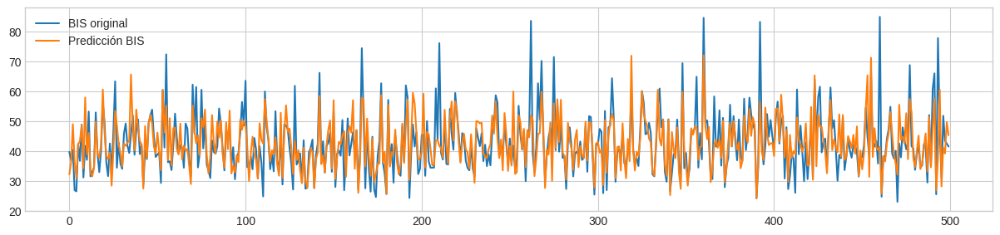

In [ ]:
lista=['iv1_Left hand',
 'approach_Videoscopic',
 'dx_Colon cancer',
 'intraop_phe',
 'dx_Abdominal mass',
 'opname_Anterior resection',
 'dx_Incisional hernia',
 'opname_Incisional hernia repair',
 'dx_Rectal cancer',
 'est_max_hr',
 'ellipse_area',
 'intraop_ppf',
 'intraop_rocu',
 'iv1_Left forearm',
 'opname_Hernia repair',
 'position_Supine',
 'intraop_ftn',
 'dx_Colorectal cancer',
 'opname_Hemicolectomy',
 'dx_Tubulovillous adenoma, colon',
 'opname_Ileocecectomy',
 'dx_Colon cancer, ascending',
 'ent_svden_ecg',
 'bmi',
 'intraop_eph',
 'dx_Cecal cancer',
 'iv1_Right forearm',
 'dx_Colon perforation',
 'dx_Ileostomy status',
 'dx_Colon cancer, sigmoid',
 'dx_Colon cancer, transverse',
 'dx_Carcinoid tumor, unspecified site',
 'frac_pfd_ecg',
 'opname_Subtotal colectomy',
 'frac_dfa_ecg',
 'dx_Colon cancer, hepatic flexure',
 'pnn50']

random_state=5
y=df_x['est_median_bis']
X=df_x[lista]#(df_x.drop('est_median_bis', axis=1))
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3,random_state=random_state)
regr = XGBRegressor(n_estimators=500, max_depth=10,random_state=random_state) #valores entre uno y 10
modelo=regr.fit(X_trainset, y_trainset)
y_rest=modelo.predict(X_testset)

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(y_rest[0:500],'-',label='Predicción BIS')
plt.legend()


mse = mean_squared_error(y_testset, y_rest)
mae = mean_absolute_error(y_testset, y_rest)
r2 = r2_score(y_testset, y_rest)
correlation_coef, p_value = pearsonr(y_testset, y_rest)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')


Un paciente

5103.0
MAE: 10.536672356015158
MSE: 136.5495899338009
R-squared: -2.162523140981207
Correlación: 0.41547953725596737


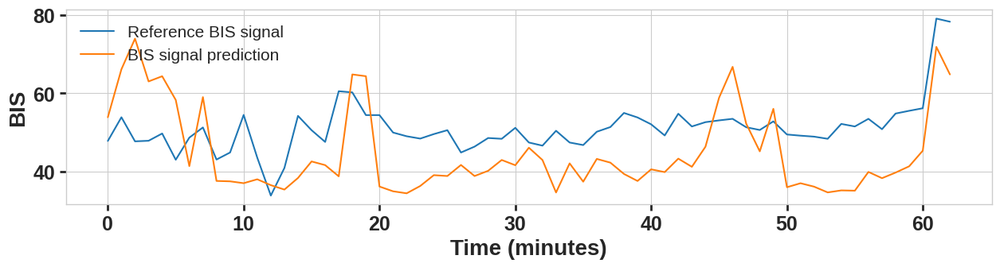

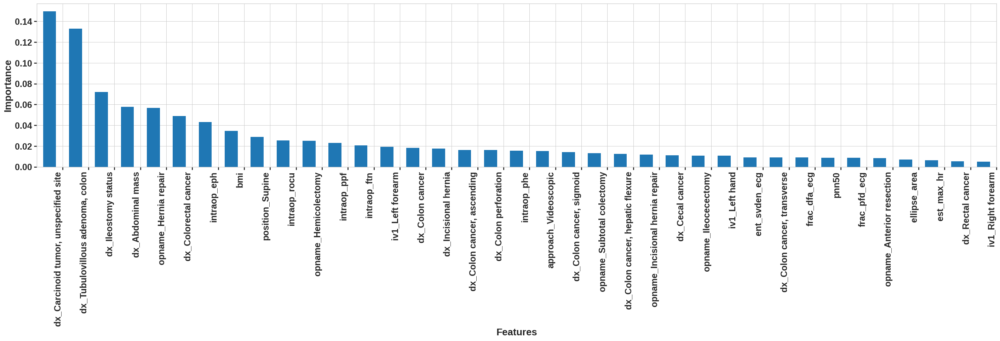

In [ ]:
#TEST CON UN PACIENTE
from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler

y=df_x[['est_median_bis']]
X = df_x[lista]
gss = GroupShuffleSplit(n_splits=1, test_size=0.2)
train_index, test_index = next(gss.split(X, y, groups=df_x['id_case']))
unique_test_idcases = df_x.loc[test_index, 'id_case'].unique()
selected_test_idcase = np.random.choice(unique_test_idcases)
#selected_test_idcase=616
print(selected_test_idcase)
X_testset = X.loc[df_x['id_case'] == selected_test_idcase]
y_testset = y.loc[df_x['id_case'] == selected_test_idcase]
X_trainset = X.loc[df_x['id_case'] != selected_test_idcase]
y_trainset = y.loc[df_x['id_case'] != selected_test_idcase]
scaler = StandardScaler()
X_trainset = scaler.fit_transform(X_trainset)
X_testset = scaler.transform(X_testset)
reg =  XGBRegressor(n_estimators=500, max_depth=10,random_state=random_state)
modelo=reg.fit(X_trainset, y_trainset)
ypred=modelo.predict(X_testset)

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset['est_median_bis'].values,'-', label='Reference BIS signal ')
plt.legend(fontsize=15,loc='upper left')
plt.subplot(211)
plt.plot(ypred,'-',label='BIS signal prediction')
plt.legend(fontsize=15,loc='upper left')
plt.xlabel('Time (minutes)',fontsize=20,fontweight='bold')
plt.ylabel('BIS',fontsize=20,fontweight='bold')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')

mse = mean_squared_error(y_testset['est_median_bis'].values, ypred)
mae = mean_absolute_error(y_testset['est_median_bis'].values, ypred)
r2 = r2_score(y_testset['est_median_bis'].values, ypred)
correlation_coef, p_value = pearsonr(y_testset['est_median_bis'].values, ypred)
print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

feature_importances = pd.Series(modelo.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(35,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')
ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)



plt.xlabel('Features',fontsize=20,fontweight='bold')
plt.ylabel('Importance',fontsize=20,fontweight='bold')
#plt.title('Importancia de características')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')
plt.show()

###Ramdon forest regression

Con un paciente

In [ ]:
# CON UN PACIENTE
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GroupShuffleSplit

y=df_x[['est_median_bis']]
X = df_x.drop(['est_median_bis','id_case'], axis=1)  # normal: df_x.drop(['est_median_bis','id_case'], axis=1)
#cantidad_w=(X['id_case'].value_counts()).index[0]

# Definir el GroupShuffleSplit# Obtener los índices de los datos de entrenamiento y prueba
train_index, test_index = next(gss.split(X, y, groups=df_x['id_case']))
# Elegir aleatoriamente un idcase para el conjunto de prueba
unique_test_idcases = df_x.loc[test_index, 'id_case'].unique()
selected_test_idcase = np.random.choice(unique_test_idcases)


# Filtrar el conjunto de prueba para tener solo un idcase
X_testset = X.loc[df_x['id_case'] == selected_test_idcase]
y_testset = y.loc[df_x['id_case'] == selected_test_idcase]

# Filtrar el conjunto de entrenamiento para excluir el idcase seleccionado para prueba
X_trainset = X.loc[df_x['id_case'] != selected_test_idcase]
y_trainset = y.loc[df_x['id_case'] != selected_test_idcase]


#pacientes=X_testset['id_case'].unique()
#cantidad_w=X_testset['id_case'].value_counts()

#print(f'Lista de id de pacientes:\n {pacientes}\n')
#print(f'Cantidad de datos (ventanas de 60 segundos):\n{cantidad_w}')


reg = GradientBoostingRegressor(n_estimators=500,random_state=0)
modelo=reg.fit(X_trainset, y_trainset)
y_rest=modelo.predict(X_testset)

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset.values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(y_rest,'-',label='Predicción BIS')
plt.legend()

mse = mean_squared_error(y_testset['est_median_bis'].values, y_rest)
mae = mean_absolute_error(y_testset['est_median_bis'].values, y_rest)
r2 = r2_score(y_testset['est_median_bis'].values, y_rest)
correlation_coef, p_value = pearsonr(y_testset['est_median_bis'].values, y_rest)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')


MAE: 5.792121051087256
MSE: 77.66307570652724
R-squared: 0.40534098537552377
Correlación: 0.6423470819997635


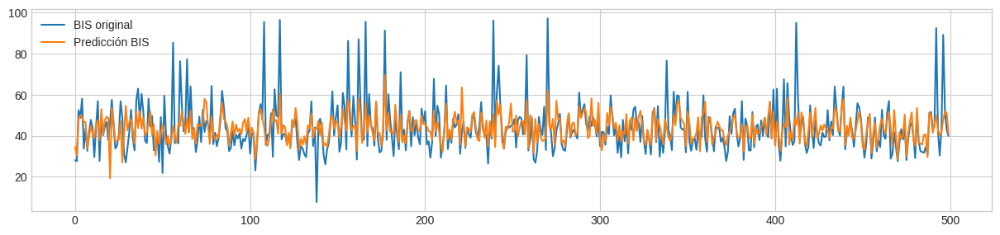

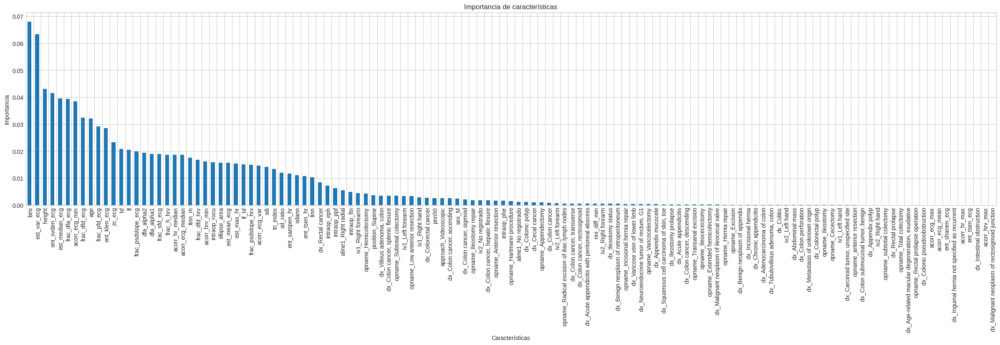

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression


y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
regr = RandomForestRegressor(criterion='poisson',max_depth=20, random_state=42)
modelo=regr.fit(X_trainset, y_trainset)
y_rest=modelo.predict(X_testset)


plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(y_rest[0:500],'-',label='Predicción BIS')
plt.legend()

mse = mean_squared_error(y_testset, y_rest)
mae = mean_absolute_error(y_testset, y_rest)
r2 = r2_score(y_testset, y_rest)
correlation_coef, p_value = pearsonr(y_testset, y_rest)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')



feature_importances = pd.Series(modelo.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(30,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)

plt.xlabel('Características')
plt.ylabel('Importancia')
plt.title('Importancia de características')
plt.show()

#feature_importances.index.tolist()



In [ ]:
valores=feature_importances.values.tolist()
c=0
cont=0

while c<0.94:
  c=valores[cont]+c
  cont=cont+1
columnas=feature_importances.index.tolist()
print(columnas[cont])

dx_Colon cancer, splenic flexure


In [ ]:
feature_importances.index.tolist()

['bmi',
 'est_var_ecg',
 'height',
 'ent_svden_ecg',
 'est_median_ecg',
 'frac_dfa_ecg',
 'acorr_ecg_min',
 'frac_dfd_ecg',
 'age',
 'frac_pfd_ecg',
 'ent_klen_ecg',
 'zc_ecg',
 'hf',
 'lf',
 'frac_psdslope_ecg',
 'dfa_alpha2',
 'dfa_alpha1',
 'frac_sfd_ecg',
 'frac_h_hrv',
 'acorr_hr_median',
 'acorr_ecg_median',
 'tinn_m',
 'frac_dfd_hrv',
 'acorr_hrv_min',
 'intraop_rocu',
 'ellipse_area',
 'est_mean_ecg',
 'est_max_hr',
 'lf_hf',
 'frac_psdslope_hrv',
 'acorr_ecg_var',
 'sdi',
 'tri_index',
 'sd_ratio',
 'ent_sampen_hr',
 'sdann',
 'ent_tsen_hr',
 'tinn',
 'dx_Rectal cancer',
 'intraop_eph',
 'intraop_ppf',
 'aline1_Right radial',
 'intraop_ftn',
 'iv1_Right forearm',
 'opname_Hemicolectomy',
 'position_Supine',
 'dx_Villous adenoma, colon',
 'dx_Colon cancer, splenic flexure',
 'opname_Subtotal colectomy',
 'iv1_Left forearm',
 'opname_Low anterior resection',
 'iv1_Right hand',
 'dx_Colorectal cancer',
 'pnn50',
 'approach_Videoscopic',
 'dx_Colon cancer, ascending',
 'sex_M',
 '

MAE: 5.770669757913424
MSE: 77.03022650187528
R-squared: 0.39586147507444025
Correlación: 0.634168764304296


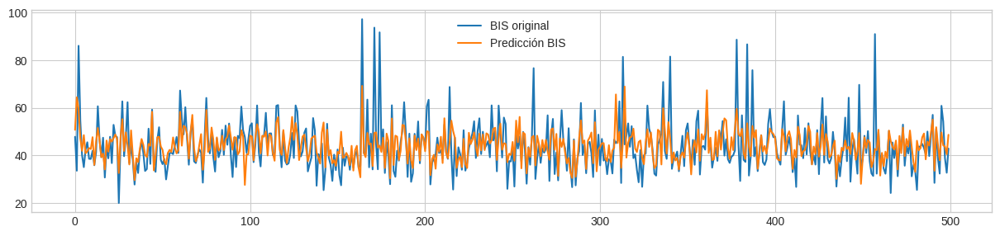

In [ ]:
lista=['bmi',
 'est_var_ecg',
 'height',
 'ent_svden_ecg',
 'est_median_ecg',
 'frac_dfa_ecg',
 'acorr_ecg_min',
 'frac_dfd_ecg',
 'age',
 'frac_pfd_ecg',
 'ent_klen_ecg',
 'zc_ecg',
 'hf',
 'lf',
 'frac_psdslope_ecg',
 'dfa_alpha2',
 'dfa_alpha1',
 'frac_sfd_ecg',
 'frac_h_hrv',
 'acorr_hr_median',
 'acorr_ecg_median',
 'tinn_m',
 'frac_dfd_hrv',
 'acorr_hrv_min',
 'intraop_rocu',
 'ellipse_area',
 'est_mean_ecg',
 'est_max_hr',
 'lf_hf',
 'frac_psdslope_hrv',
 'acorr_ecg_var',
 'sdi',
 'tri_index',
 'sd_ratio',
 'ent_sampen_hr',
 'sdann',
 'ent_tsen_hr',
 'tinn',
 'dx_Rectal cancer',
 'intraop_eph',
 'intraop_ppf',
 'aline1_Right radial',
 'intraop_ftn',
 'iv1_Right forearm',
 'opname_Hemicolectomy',
 'position_Supine',
 'dx_Villous adenoma, colon',
 'dx_Colon cancer, splenic flexure']



y=df_x['est_median_bis']
X=df_x[lista]#(df_x.drop('est_median_bis', axis=1))
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
regr = RandomForestRegressor(criterion='poisson',max_depth=20, random_state=42)
modelo=regr.fit(X_trainset, y_trainset)
y_rest=modelo.predict(X_testset)


plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(y_rest[0:500],'-',label='Predicción BIS')
plt.legend()

mse = mean_squared_error(y_testset, y_rest)
mae = mean_absolute_error(y_testset, y_rest)
r2 = r2_score(y_testset, y_rest)
correlation_coef, p_value = pearsonr(y_testset, y_rest)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')


### Regresión simple con árbol de decisión

https://medium.com/@nandiniverma78988/simple-decision-tree-regression-in-python-with-scikit-learn-0bdf72550049#:~:text=Decision%20tree%20regression%20is%20a,predict%20a%20continuous%20target%20variable.

In [ ]:
# CON UN PACIENTE

MAE: 5.817966241540268
MSE: 63.66267781733712
R-squared: -0.9627826417582062
Correlación: -0.23744810352654394


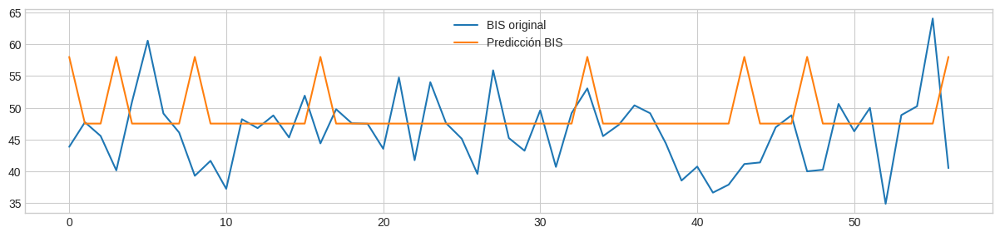

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from scipy.stats import pearsonr
from sklearn.metrics import r2_score

y=df_x[['est_median_bis','id_case']]
X = df_x.drop(['est_median_bis'], axis=1)  # normal: df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)

pacientes=X_testset['id_case'].unique()
cantidad_w=X_testset['id_case'].value_counts()

#print(f'Lista de id de pacientes:\n {pacientes}\n')
#print(f'Cantidad de datos (ventanas de 60 segundos):\n{cantidad_w}')
id=534
X_testset=(X_testset[X_testset['id_case']==id]).drop(['id_case'],axis=1)
X_trainset=X_trainset.drop(['id_case'],axis=1)

y_trainset=y_trainset.drop(['id_case'],axis=1)
y_testset=(y_testset[y_testset['id_case']==id]).drop(['id_case'],axis=1)

reg = DecisionTreeRegressor(criterion='squared_error',max_depth=8, random_state=44)
modelo=reg.fit(X_trainset, y_trainset)
y_rest=modelo.predict(X_testset)

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(y_rest[0:500],'-',label='Predicción BIS')
plt.legend()


mse = mean_squared_error(y_testset['est_median_bis'].values, y_rest)
mae = mean_absolute_error(y_testset['est_median_bis'].values, y_rest)
r2 = r2_score(y_testset['est_median_bis'].values, y_rest)
correlation_coef, p_value = pearsonr(y_testset['est_median_bis'].values, y_rest)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')


MAE: 7.228343022397182
MSE: 121.62079804546045
R-squared: 0.1347568792211299
Correlación: 0.39737397481678616


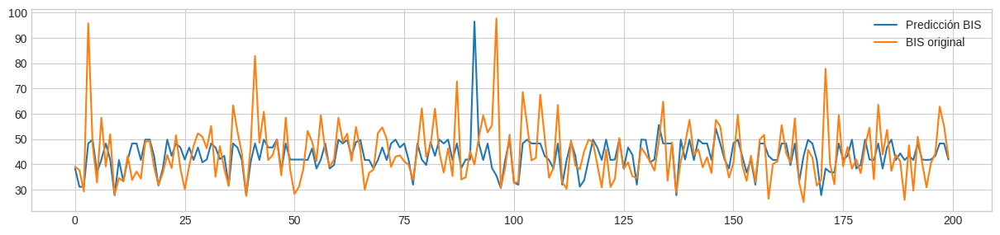

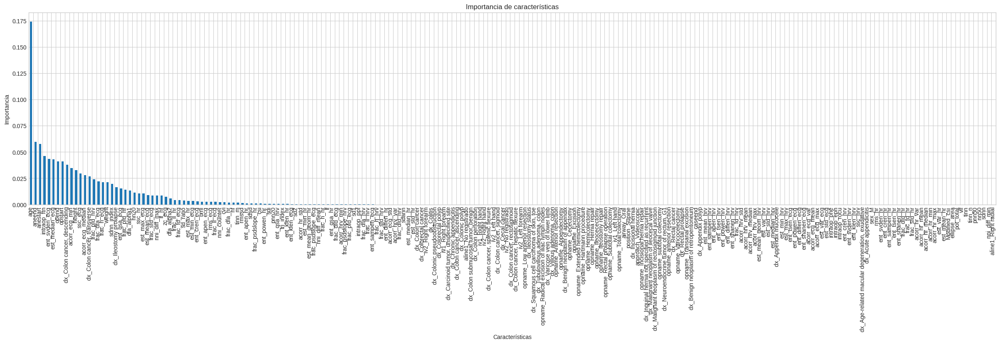

In [ ]:

X=df_x.drop(['est_median_bis','id_case'], axis=1)
y=df_x['est_median_bis']
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
'''
pacientes=X_testset['id_case'].unique()
cantidad_w=X_testset['id_case'].value_counts()

print(f'Lista de id de pacientes:\n {pacientes}\n')
print(f'Cantidad de datos (ventanas de 60 segundos):\n{cantidad_w}')
#X_testset[X_testset['id_case']==5786]
'''

regressor = DecisionTreeRegressor(criterion='squared_error',max_depth=8, random_state=44)
regressor.fit(X_trainset,y_trainset)

#X_testset2=X_testset[X_testset['id_case']==2418.0]
#indices_filas_cumplen_condicion = X_testset.loc[X_testset['id_case'] == 2418.0].index
#y_testset2 = y_testset.loc[indices_filas_cumplen_condicion]
predTree=regressor.predict(X_testset)

plt.figure(figsize=(15, 7))
plt.subplot(211)
plt.plot(predTree[0:200],label='Predicción BIS')
plt.legend()
plt.subplot(211)
plt.plot(y_testset[0:200].values, label='BIS original')
plt.legend()

mse = mean_squared_error(y_testset, predTree)
mae = mean_absolute_error(y_testset, predTree)
r2 = r2_score(y_testset, predTree)
correlation_coef, p_value = pearsonr(y_testset, predTree)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')


feature_importances = pd.Series(regressor.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(30,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)

plt.xlabel('Características')
plt.ylabel('Importancia')
plt.title('Importancia de características')
plt.show()

In [ ]:
feature_importances.index.tolist()

MAE: 6.985090600424631
MSE: 110.16127558722431
R-squared: 0.1852678874263678
Correlación: 0.46043572999471216


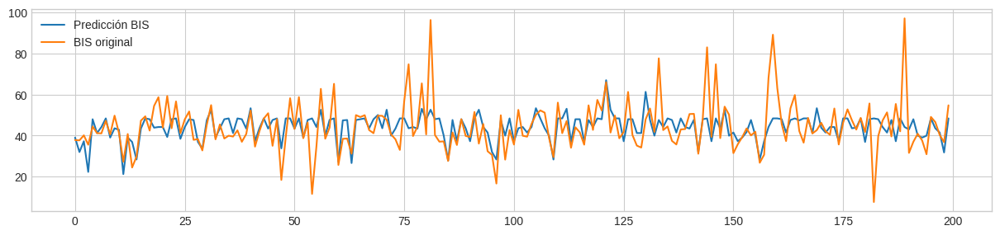

In [ ]:


lista=['age',
 'aneend',
 'anestart',
 'intraop_ftn',
 'ent_svden_ecg',
 'est_median_ecg',
 'opend',
 'opstart',
 'dx_Colon cancer, descending',
 'acorr_ecg_min',
 'height',
 'ssc_ecg',
 'acorr_ecg_median',
 'dx_Colon cancer, transverse',
 'frac_pfd_hrv',
 'frac_dfa_ecg',
 'frac_h_ecg',
 'weight',
 'sdnn_index',
 'dx_Ileostomy prolapse',
 'ent_qsa_ecg',
 'frac_pfd_hr',
 'dfa_alpha1',
 'nn20',
 'ssc_hr',
 'est_max_ecg',
 'est_mean_ecg',
 'frac_sfd_ecg',
 'nni_diff_max',
 'lf_hf',
 'zc_ecg',
 'dfa_alpha2',
 'frac_ll_hr',
 'frac_fd_ecg',
 'sd_ratio',
 'est_max_hr',
 'est_min_ecg',
 'ent_cren_ecg',
 'bmi',
 'ent_apen_ecg',
 'rms_ecg',
 'frac_ll_ecg',
 'nni_counter',
 'cvi',
 'frac_dfa_hr',
 'hf',
 'tinn_m',
 'rmssd',
 'ent_apen_hr',
 'sdsd',
 'frac_psdslope_hr',
 'csi',
 'ent_powen_hr',
 'sdi']


X=df_x[lista]#(df_x.drop('est_median_bis', axis=1))
y=df_x['est_median_bis']
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
'''
pacientes=X_testset['id_case'].unique()
cantidad_w=X_testset['id_case'].value_counts()

print(f'Lista de id de pacientes:\n {pacientes}\n')
print(f'Cantidad de datos (ventanas de 60 segundos):\n{cantidad_w}')
#X_testset[X_testset['id_case']==5786]
'''

regressor = DecisionTreeRegressor(criterion='squared_error',max_depth=8, random_state=44)
regressor.fit(X_trainset,y_trainset)

#X_testset2=X_testset[X_testset['id_case']==2418.0]
#indices_filas_cumplen_condicion = X_testset.loc[X_testset['id_case'] == 2418.0].index
#y_testset2 = y_testset.loc[indices_filas_cumplen_condicion]
predTree=regressor.predict(X_testset)

plt.figure(figsize=(15, 7))
plt.subplot(211)
plt.plot(predTree[0:200],label='Predicción BIS')
plt.legend()
plt.subplot(211)
plt.plot(y_testset[0:200].values, label='BIS original')
plt.legend()

mse = mean_squared_error(y_testset, predTree)
mae = mean_absolute_error(y_testset, predTree)
r2 = r2_score(y_testset, predTree)
correlation_coef, p_value = pearsonr(y_testset, predTree)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')


In [ ]:
feature_importances.index.tolist()



### Redes neuronales

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense

classifier = Sequential()

# Adding the input layer and the first hidden layer
classifier.add(Dense(units = 128, activation = 'relu'))

# Adding the second hidden layer
classifier.add(Dense(units = 64, activation = 'relu'))

classifier.add(Dense(units = 32, activation = 'relu'))

# Adding the output layer
classifier.add(Dense(units = 1, activation = 'linear'))

# Compiling the ANN
classifier.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])

### Estos algoritmos dan buenos resultados

In [ ]:
'''
BAYESIAN RIDGE REGRESSION
RIDGE REGRESSION
Kernel Ridge Regression
ExtraTreesRegressor
LGBM Regressor
'''

## **Implementación de otros modelos**

### Redes neuronales: CNN

In [ ]:
# univariate cnn example
!pip install keras
from numpy import array
import joblib
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.layers import MaxPooling1D
from numpy import hstack

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GroupShuffleSplit


In [ ]:
#X=df_x.drop(['est_median_bis','id_case'], axis=1)
lista=['frac_pfd_ecg',
 'frac_dfa_ecg',
 'est_max_hr',
 'frac_sfd_ecg',
 'est_median_ecg',
 'ent_svden_ecg',
 'acorr_ecg_min',
 'tinn_m',
 'tri_index',
 'est_var_ecg',
 'frac_h_hrv',
 'hf',
 'sdi',
 'lf',
 'ellipse_area',
 'zc_ecg',
 'ent_klen_ecg',
 'frac_dfd_ecg',
 'frac_psdslope_ecg',
 'dfa_alpha1',
 'height',
 'sdann',
 'frac_psdslope_hrv',
 'lf_hf',
 'acorr_ecg_var',
 'pnn50',
 'sd_ratio',
 'ent_sampen_hr',
 'dfa_alpha2',
 'acorr_hr_median',
 'tinn',
 'frac_dfd_hrv',
 'acorr_ecg_median',
 'est_mean_ecg',
 'acorr_hrv_min',
 'ent_tsen_hr',
 'nni_diff_min']


 # split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the dataset
		if end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)

def acomodarDatosCNN(df_x,columnas,n_steps,i,index):
	data=df_x.loc[df_x['id_case']==index[i]].reset_index(drop=True)
	X=data[columnas]
	y=data['est_median_bis']
	features=X.values.T
	target=y.values.T
	reshaped_features = [array.reshape((len(array), 1)) for array in features]  # Aplicar reshape a cada array dentro del array de arrays
	reshaped_target = target.reshape((len(target), 1))
	dataset = np.hstack(reshaped_features + [reshaped_target]) # Concatenar horizontalmente todos los arrays
	X, y = split_sequences(dataset, n_steps)
	return X,y

#### Extratree regressor

In [ ]:

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import GroupShuffleSplit

In [ ]:
'''
id_unique=df_x['id_case'].unique().tolist()
conteo_valores = df_x['id_case'].value_counts()
id_unique = conteo_valores[conteo_valores < 6].index.tolist()
df_filtrado = df_x[~df_x['id_case'].isin(id_unique)].reset_index(drop=True)
'''

gss = GroupShuffleSplit(n_splits=1, test_size=0.3)
train_index, test_index = next(gss.split(df_x[lista], df_x['est_median_bis'], groups=df_x['id_case']))
train_index_lista = df_x.loc[train_index, 'id_case'].unique()
test_index_lista = df_x.loc[test_index, 'id_case'].unique()
#selected_test_idcase = np.random.choice(unique_test_idcases)
#selected_test_idcase=1401
lista_results_test=[]

for i in range(0,len(train_index_lista),1):
  data=df_x.loc[df_x['id_case']==train_index_lista[i]].reset_index(drop=True)
  X=data[lista]
  y=data['est_median_bis']
  if i>0:
    x_testear=X
    y_testear=y
    #model = joblib.load('model.pkl')
    yhat = regr.predict(x_testear)
    mse = mean_squared_error(y_testear, yhat)
    mae = mean_absolute_error(y_testear, yhat)
    try:
      r2 = r2_score(y_testear, yhat)
      correlation_coef, p_value = pearsonr(y_testear, yhat)
    except Exception as e:
      r2 = 0
      correlation_coef = 0
      p_value = 0
    print(f'{mae}---{i}')
    lista_results_test.append((train_index_lista[i-1], mse, mae, r2, correlation_coef, p_value))


  if i==0:
    regr = ExtraTreesRegressor(random_state=0, n_estimators=80, max_depth=4)
    regr.fit(X, y)
  else:
    regr.fit(X, y)
#joblib.dump(model, 'model.pkl')

In [ ]:
maes=[]
for i in range(0,len(test_index_lista),1):
  data=df_x.loc[df_x['id_case']==test_index_lista[i]].reset_index(drop=True)
  X=data[lista]
  y=data['est_median_bis'].values
  yhat = regr.predict(X)
  mse = mean_squared_error(y, yhat)
  mae = mean_absolute_error(y, yhat)
  maes.append(mae)   #guardar es el test_index_lista y los mae en dataframe

maes

462.9208886938429

In [ ]:
selected_test_idcase=[]
selected_test_idcase.append(np.random.choice(test_index_lista))
for i in range(0,len(selected_test_idcase),1):
  data=df_x.loc[df_x['id_case']==selected_test_idcase[i]].reset_index(drop=True)
  X=data[lista]
  y=data['est_median_bis'].values
  yhat = regr.predict(X)
  mse = mean_squared_error(y, yhat)
  mae = mean_absolute_error(y, yhat)

  plt.figure(figsize=(15, 7))
  plt.subplot(211)
  plt.plot(yhat,label='Predicción BIS')
  plt.legend()
  plt.subplot(211)
  plt.plot(y, label='BIS original')
  plt.legend()

#### Entrenando y probando con pacientes

In [ ]:

#extrayendo los valores unicos de id
#X=df_x.drop(['est_median_bis','id_case'], axis=1)
id_unique=df_x['id_case'].unique().tolist()
conteo_valores = df_x['id_case'].value_counts()
id_unique = conteo_valores[conteo_valores < 6].index.tolist()
df_filtrado = df_x[~df_x['id_case'].isin(id_unique)].reset_index(drop=True)

gss = GroupShuffleSplit(n_splits=1, test_size=0.3)
train_index, test_index = next(gss.split(df_x[lista], df_x['est_median_bis'], groups=df_x['id_case']))
train_index_lista = df_x.loc[train_index, 'id_case'].unique()
test_index_lista = df_x.loc[test_index, 'id_case'].unique()
#selected_test_idcase = np.random.choice(unique_test_idcases)
#selected_test_idcase=1401
lista_results_test=[]

for i in range(0,len(train_index_lista),1):
  n_steps = 3
  X,y=acomodarDatosCNN(df_x,lista,n_steps,i,train_index_lista);
  n_features = X.shape[2]
  if i>0:
    x_testear=X
    y_testear=y
    #model = joblib.load('model.pkl')
    yhat = model.predict(x_testear, verbose=0).T[0]
    mse = mean_squared_error(y_testear, yhat)
    mae = mean_absolute_error(y_testear, yhat)
    try:
      r2 = r2_score(y_testear, yhat)
      correlation_coef, p_value = pearsonr(y_testear, yhat)
    except Exception as e:
      r2 = 0
      correlation_coef = 0
      p_value = 0
    print(f'{mae}---{i}')
    lista_results_test.append((train_index_lista[i-1], mse, mae, r2, correlation_coef, p_value))


  if i==0:
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, n_features)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(50, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    model.fit(X, y, epochs=1000, verbose=0)
  else:
    model.fit(X, y, epochs=1000, verbose=0)
joblib.dump(model, 'model.pkl')

#df_resultados = pd.DataFrame(lista_results_test, columns=['id_case', 'mse', 'mae', 'r2', 'correlation_coef', 'p_value'])


In [ ]:
df_x.loc[df_x['id_case']==train_index_lista[15]]

5429.0

####Entrenando con el 70 y probando con el 30

In [ ]:

# split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the dataset
		if end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)

def acomodarDatosCNN(df_x,columnas,n_steps,i,index):
	data=df_x.loc[df_x['id_case']==index[i]].reset_index(drop=True)
	X=data[columnas]
	y=data['est_median_bis']
	features=X.values.T
	target=y.values.T
	reshaped_features = [array.reshape((len(array), 1)) for array in features]  # Aplicar reshape a cada array dentro del array de arrays
	reshaped_target = target.reshape((len(target), 1))
	dataset = np.hstack(reshaped_features + [reshaped_target]) # Concatenar horizontalmente todos los arrays
	X, y = split_sequences(dataset, n_steps)
	return X,y


lista=['frac_pfd_ecg','frac_dfa_ecg','est_max_hr','frac_sfd_ecg','age','est_median_ecg','bmi','ent_svden_ecg',
       'acorr_ecg_min','tinn_m','tri_index','est_var_ecg','frac_h_hrv','hf','sdi','lf','ellipse_area','zc_ecg',
       'ent_klen_ecg','frac_dfd_ecg','frac_psdslope_ecg','dfa_alpha1','height','sdann','frac_psdslope_hrv','lf_hf',
       'acorr_ecg_var','pnn50','sd_ratio','ent_sampen_hr','dfa_alpha2','acorr_hr_median','tinn','frac_dfd_hrv',
       'acorr_ecg_median','est_mean_ecg','acorr_hrv_min','ent_tsen_hr','nni_diff_min']


#Por si hay un pacientes con muy pocos segmentos
id_unique=df_x['id_case'].unique().tolist()
conteo_valores = df_x['id_case'].value_counts()
id_unique = conteo_valores[conteo_valores < 6].index.tolist()
df_x = df_x[~df_x['id_case'].isin(id_unique)].reset_index(drop=True)

#Para dividir la señal en entrenar y testear
gss = GroupShuffleSplit(n_splits=1, test_size=0.3)
train_index, test_index = next(gss.split(df_x[lista], df_x['est_median_bis'], groups=df_x['id_case']))
train_index_lista = df_x.loc[train_index, 'id_case'].unique()
test_index_lista = df_x.loc[test_index, 'id_case'].unique()
#selected_test_idcase = np.random.choice(test_index_lista)
#selected_test_idcase=1401
lista_results_test=[]

#Para entrenar

n_steps = 3
for i in range(0,len(train_index_lista),1):
  X,y=acomodarDatosCNN(df_x,lista,n_steps,i,train_index_lista);
  n_features = X.shape[2]
  if i==0:
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, n_features)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(50, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')  #Adagrad
  model.fit(X, y, epochs=1000, verbose=0)
joblib.dump(model, 'model.pkl')

#Para probar
maes=[]
for i in range(0,len(test_index_lista),1):
  X,y=acomodarDatosCNN(df_x,lista,n_steps,i,test_index_lista);
  yhat = model.predict(X, verbose=0).T[0]
  mse = mean_squared_error(y, yhat)
  mae = mean_absolute_error(y, yhat)
  maes.append(mae)   #guardar es el test_index_lista y los mae en dataframe

####maes

In [ ]:
maes

[77.06088099964833,
 4.0843636515230894,
 4.507087611826835,
 15.502155523271103,
 10.116023193011898,
 16.57390364009609,
 14.929464121078581,
 16.497646310720384,
 188.3840165192462,
 30.063695519636934,
 10.813405780470239,
 8.866423050353927,
 6.527680024847317,
 26.331356371669035,
 35.248628444226576,
 40.291508692372105,
 19.00663710580979,
 55.442658835262385,
 33.673350522191726,
 231.2733724922241,
 14.81713424844439,
 22.227642608884853,
 87.46912401292333,
 59.197692047158625,
 10.832820275527993,
 12.509745921971376,
 11.492188823659214,
 72.47003351380633,
 33.65231439317641,
 20.702300011726003,
 21.694026809635602,
 32.59755604067643,
 17.382047106297648,
 11.595302711869184,
 304.725026199411,
 5.332690102010539,
 8.087855579481465,
 10.91862807786169,
 12844.192226074823,
 5.658321259484683,
 15.309271968219413,
 7.67733281682257,
 186.40403427421444,
 64.0288173708442,
 15.080567192082842,
 12.084227657725322,
 76.68177198947272,
 5.98222112433855]

In [ ]:
pd.DataFrame(test_index_lista)
pd.DataFrame(test_index_lista).to_csv('test_index_lista.csv', index=False)

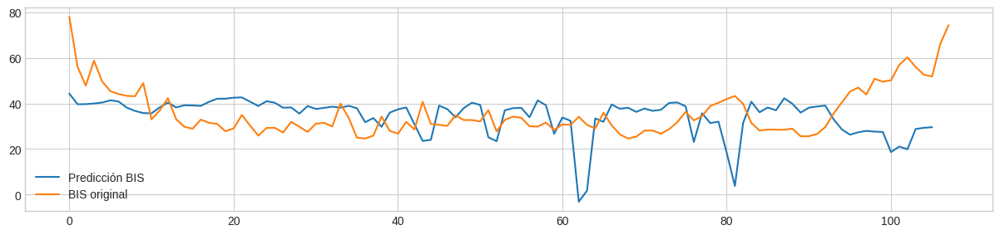

In [ ]:

selected_test_idcase=[]
selected_test_idcase.append(np.random.choice(test_index_lista))
for i in range(0,len(selected_test_idcase),1):
  X,y=acomodarDatosCNN(df_x,lista,n_steps,i,selected_test_idcase);
  yhat = model.predict(X, verbose=0).T[0]
  ytest=df_x.loc[df_x['id_case']==selected_test_idcase[i]]['est_median_bis']
  mse = mean_squared_error(y, yhat)
  mae = mean_absolute_error(y, yhat)


plt.figure(figsize=(15, 7))
plt.subplot(211)
plt.plot(yhat,label='Predicción BIS')
plt.legend()
plt.subplot(211)
plt.plot(ytest.values, label='BIS original')
plt.legend()

### Redes neuronales: LSTM

In [ ]:
from keras.layers import LSTM
lista=['frac_pfd_ecg','frac_dfa_ecg','est_max_hr','frac_sfd_ecg','age','est_median_ecg','bmi','ent_svden_ecg',
       'acorr_ecg_min','tinn_m','tri_index','est_var_ecg','frac_h_hrv','hf','sdi','lf','ellipse_area','zc_ecg',
       'ent_klen_ecg','frac_dfd_ecg','frac_psdslope_ecg','dfa_alpha1','height','sdann','frac_psdslope_hrv','lf_hf',
       'acorr_ecg_var','pnn50','sd_ratio','ent_sampen_hr','dfa_alpha2','acorr_hr_median','tinn','frac_dfd_hrv',
       'acorr_ecg_median','est_mean_ecg','acorr_hrv_min','ent_tsen_hr','nni_diff_min']


#Por si hay un pacientes con muy pocos segmentos
id_unique=df_x['id_case'].unique().tolist()
conteo_valores = df_x['id_case'].value_counts()
id_unique = conteo_valores[conteo_valores < 6].index.tolist()
df_x = df_x[~df_x['id_case'].isin(id_unique)].reset_index(drop=True)


#Para dividir la señal en entrenar y testear
gss = GroupShuffleSplit(n_splits=1, test_size=0.3)
train_index, test_index = next(gss.split(df_x[lista], df_x['est_median_bis'], groups=df_x['id_case']))
train_index_lista = df_x.loc[train_index, 'id_case'].unique()
test_index_lista = df_x.loc[test_index, 'id_case'].unique()
#selected_test_idcase = np.random.choice(test_index_lista)
#selected_test_idcase=1401
lista_results_test=[]


#Para entrenar
n_steps = 3
for i in range(0,len(train_index_lista),1):
  X,y=acomodarDatosCNN(df_x,lista,n_steps,i,train_index_lista);
  n_features = X.shape[2]
  if i==0:
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
  model.fit(X, y, epochs=1000, verbose=1)
joblib.dump(model, 'model.pkl')

#Para probar
maes=[]
for i in range(0,len(test_index_lista),1):
  X,y=acomodarDatosCNN(df_x,lista,n_steps,i,test_index_lista);
  yhat = model.predict(X, verbose=0).T[0]
  mse = mean_squared_error(y, yhat)
  mae = mean_absolute_error(y, yhat)
  maes.append(mae)   #guardar es el test_index_lista y los mae en dataframe

# split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the dataset
		if end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)

def acomodarDatosCNN(df_x,columnas,n_steps,i,index):
	data=df_x.loc[df_x['id_case']==index[i]].reset_index(drop=True)
	X=data[columnas]
	y=data['est_median_bis']
	features=X.values.T
	target=y.values.T
	reshaped_features = [array.reshape((len(array), 1)) for array in features]  # Aplicar reshape a cada array dentro del array de arrays
	reshaped_target = target.reshape((len(target), 1))
	dataset = np.hstack(reshaped_features + [reshaped_target]) # Concatenar horizontalmente todos los arrays
	X, y = split_sequences(dataset, n_steps)
	return X,y


Se han truncado las últimas 5000 líneas del flujo de salida.
4/4 [==============================] - 0s 8ms/step - loss: 39.6098
Epoch 155/1000
4/4 [==============================] - 0s 7ms/step - loss: 38.2617
Epoch 156/1000
4/4 [==============================] - 0s 7ms/step - loss: 39.8382
Epoch 157/1000
4/4 [==============================] - 0s 7ms/step - loss: 37.9906
Epoch 158/1000
4/4 [==============================] - 0s 7ms/step - loss: 39.5214
Epoch 159/1000
4/4 [==============================] - 0s 7ms/step - loss: 38.2735
Epoch 160/1000
4/4 [==============================] - 0s 7ms/step - loss: 39.4538
Epoch 161/1000
4/4 [==============================] - 0s 7ms/step - loss: 39.0489
Epoch 162/1000
4/4 [==============================] - 0s 7ms/step - loss: 38.8473
Epoch 163/1000
4/4 [==============================] - 0s 7ms/step - loss: 38.7791
Epoch 164/1000
4/4 [==============================] - 0s 7ms/step - loss: 38.5790
Epoch 165/1000
4/4 [==============================] 

In [ ]:
maes

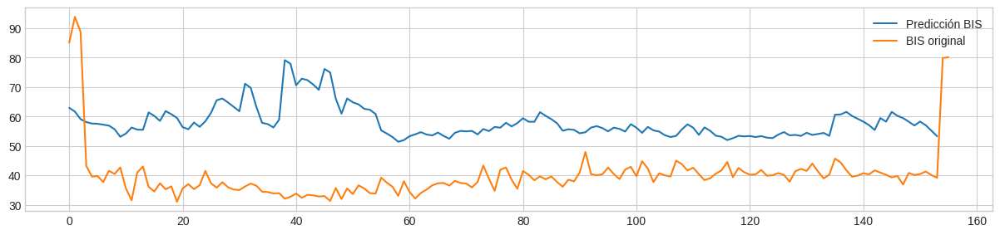

In [ ]:
selected_test_idcase=[]
selected_test_idcase.append(np.random.choice(test_index_lista))
for i in range(0,len(selected_test_idcase),1):
  X,y=acomodarDatosCNN(df_x,lista,n_steps,i,selected_test_idcase);
  yhat = model.predict(X, verbose=0).T[0]
  ytest=df_x.loc[df_x['id_case']==selected_test_idcase[i]]['est_median_bis']
  mse = mean_squared_error(y, yhat)
  mae = mean_absolute_error(y, yhat)


plt.figure(figsize=(15, 7))
plt.subplot(211)
plt.plot(yhat,label='Predicción BIS')
plt.legend()
plt.subplot(211)
plt.plot(ytest.values, label='BIS original')
plt.legend()

In [ ]:
maes

### Pacientes ordenados CNN

In [ ]:
#ordenar el dataframe
df_x

In [ ]:
lista=['frac_pfd_ecg','frac_dfa_ecg','est_max_hr','frac_sfd_ecg','age','est_median_ecg','bmi','ent_svden_ecg',
       'acorr_ecg_min','tinn_m','tri_index','est_var_ecg','frac_h_hrv','hf','sdi','lf','ellipse_area','zc_ecg',
       'ent_klen_ecg','frac_dfd_ecg','frac_psdslope_ecg','dfa_alpha1','height','sdann','frac_psdslope_hrv','lf_hf',
       'acorr_ecg_var','pnn50','sd_ratio','ent_sampen_hr','dfa_alpha2','acorr_hr_median','tinn','frac_dfd_hrv',
       'acorr_ecg_median','est_mean_ecg','acorr_hrv_min','ent_tsen_hr','nni_diff_min','']

df_x=df_x[lista]

### Regresion Lineal

In [ ]:
# evaluation of a model using all input features
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error

# load the dataset
X=df_x.drop(['est_median_bis','id_case'], axis=1)
y=df_x['est_median_bis']
# split into train and test sets
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
# fit the model
model = LinearRegression()
model.fit(X_trainset, y_trainset)
# evaluate the model
yhat = model.predict(X_testset)
# evaluate predictions
mse = mean_squared_error(y_testset, yhat)
mae = mean_absolute_error(y_testset, yhat)
r2 = r2_score(y_testset, yhat)
correlation_coef, p_value = pearsonr(y_testset, yhat)


plt.figure(figsize=(15, 7))
plt.subplot(211)
plt.plot(yhat[0:200],label='Predicción BIS')
plt.legend()
plt.subplot(211)
plt.plot(y_testset[0:200].values, label='BIS original')
plt.legend()


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

'''
from matplotlib import pyplot
importance = model.coef_
# summarize feature importance
for i,v in enumerate(importance):
 print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()
'''

plt.figure(figsize=(10,38))
plt.barh(X.columns,model.coef_)
plt.xlabel('Características')
plt.ylabel('Importancia')
plt.title('Importancia de características')
plt.show()


### ARDRegression

MAE: 7.248231325129978
MSE: 109.66067296327108
R-squared: 0.18796200020603593
Correlación: 0.4345283177779109


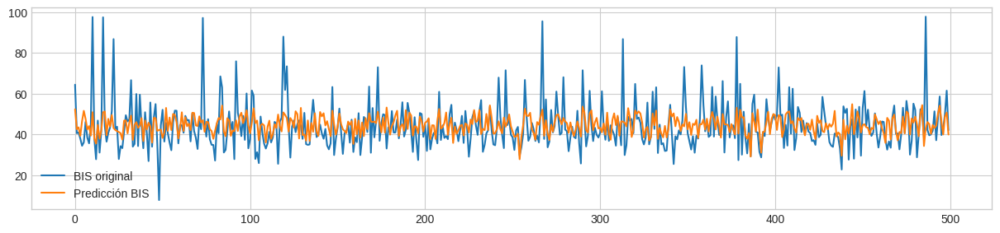

In [ ]:
from sklearn import linear_model

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
model = linear_model.ARDRegression()
model.fit(X_trainset, y_trainset)
pred=model.predict(X_testset)

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(pred[0:500],'-',label='Predicción BIS')
plt.legend()


mse = mean_squared_error(y_testset, pred)
mae = mean_absolute_error(y_testset, pred)
r2 = r2_score(y_testset, pred)
correlation_coef, p_value = pearsonr(y_testset, pred)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

### Red neuronal

Red normal

https://thinkingneuron.com/using-artificial-neural-networks-for-regression-in-python/

In [ ]:
# Installing required libraries
!pip install tensorflow
!pip install keras
!pip install scikeras
#!pip install --upgrade tensorflow

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import mean_absolute_error


X=(df_x.drop(['est_median_bis','id_case'], axis=1)).values
y=df_x['est_median_bis'].values.reshape(-1, 1)

from sklearn.preprocessing import StandardScaler
PredictorScaler=StandardScaler()
TargetVarScaler=StandardScaler()

PredictorScalerFit=PredictorScaler.fit(X)
TargetVarScalerFit=TargetVarScaler.fit(y)
X=PredictorScalerFit.transform(X)
y=TargetVarScalerFit.transform(y)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:85: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


103/103 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
The Accuracy of ANN model is: 84.97846042200422
MAE: 6.817895791692733
MSE: 101.23586183125043
R-squared: 0.24768708152060603
Correlación: 0.5266764749353203


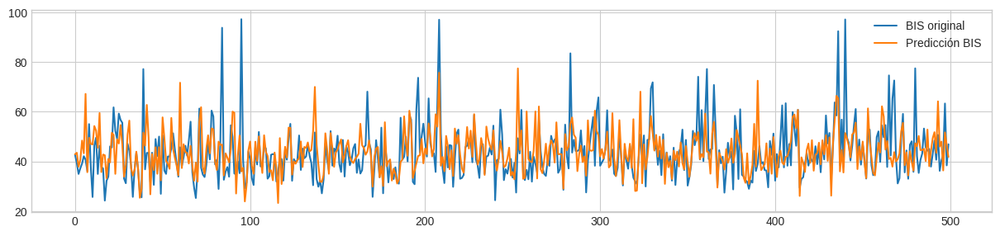

In [ ]:
#ENTRENANDO
model = Sequential()  # create ANN model
model.add(Dense(units=200, input_dim=X.shape[1], kernel_initializer='normal', activation='relu'))
#model.add(Dense(units=200, kernel_initializer='normal', activation='relu'))
model.add(Dense(units=200, activation='relu'))
model.add(Dense(units=200, kernel_initializer='normal', activation='relu'))
model.add(Dense(1, kernel_initializer='normal'))
# Compiling the model
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(X_train, y_train ,batch_size = 15, epochs = 100, verbose=0)
Predictions=model.predict(X_test)
Predictions=TargetVarScalerFit.inverse_transform(Predictions)
y_test_orig=TargetVarScalerFit.inverse_transform(y_test)
Test_Data=PredictorScalerFit.inverse_transform(X_test)

TestingData=pd.DataFrame(data=Test_Data, columns=(df_x.drop(['est_median_bis','id_case'], axis=1)).columns)  #df_x.drop('est_median_bis', axis=1).columns.tolist()
TestingData['BIS_original']=y_test_orig
TestingData['PredictedBis']=Predictions
TestingData.head()

# Computing the absolute percent error
APE=100*(abs(TestingData['BIS_original']-TestingData['PredictedBis'])/TestingData['BIS_original'])
TestingData['APE']=APE

print('The Accuracy of ANN model is:', 100-np.mean(APE))
TestingData.head()

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(TestingData['BIS_original'].values[0:500],'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(TestingData['PredictedBis'].values[0:500],'-',label='Predicción BIS')
plt.legend()

mse = mean_squared_error(TestingData['BIS_original'].values, TestingData['PredictedBis'].values)
mae = mean_absolute_error(TestingData['BIS_original'].values, TestingData['PredictedBis'].values)
r2 = r2_score(TestingData['BIS_original'].values, TestingData['PredictedBis'].values)
correlation_coef, p_value = pearsonr(TestingData['BIS_original'].values, TestingData['PredictedBis'].values)
print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

Eligiendo los mejores parámetros

In [ ]:
from tensorflow import keras
from scikeras.wrappers import KerasRegressor
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

In [ ]:
def buildModel(optimizer):
  #model = keras.Sequential()
  model = Sequential()  # create ANN model
  model.add(Dense(units=200, input_dim=X.shape[1], kernel_initializer='normal', activation='relu'))
  model.add(Dense(units=200, activation='relu'))
  model.add(Dense(units=200, kernel_initializer='normal', activation='relu'))
  model.add(Dense(units=200, kernel_initializer='normal', activation='relu'))
  model.add(Dense(1, activation='linear'))
  model.compile(loss='mean_absolute_error', optimizer=optimizer, metrics=['mean_absolute_error'])
  return model

X=(df_x.drop(['est_median_bis','id_case'], axis=1))
y=df_x['est_median_bis']

classifier = KerasRegressor(build_fn = buildModel('adam'))

#What hyperparameter we want to play with
parameters = {'batch_size': [16, 32, 64, 128],
              'epochs': [100, 150],
              'optimizer': ['adam', 'rmsprop']}
grid_search = GridSearchCV(estimator = classifier,
                           param_grid = parameters,
                           scoring = 'neg_mean_absolute_error',
                           cv = 5)
grid_search = grid_search.fit(X_trainset, y_trainset, verbose = 0)

'''
model.fit(X_train, y_train ,batch_size = 15, epochs = 100, verbose=0)
Predictions=model.predict(X_test)
Predictions=TargetVarScalerFit.inverse_transform(Predictions)
y_test_orig=TargetVarScalerFit.inverse_transform(y_test)
Test_Data=PredictorScalerFit.inverse_transform(X_test)

TestingData=pd.DataFrame(data=Test_Data, columns=col)  #df_x.drop('est_median_bis', axis=1).columns.tolist()
TestingData['BIS_original']=y_test_orig
TestingData['PredictedBis']=Predictions
TestingData.head()

# Computing the absolute percent error
APE=100*(abs(TestingData['BIS_original']-TestingData['PredictedBis'])/TestingData['BIS_original'])
TestingData['APE']=APE

print('The Accuracy of ANN model is:', 100-np.mean(APE))
TestingData.head()
'''

/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 1s 6ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 3ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 3ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


106/106 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


53/53 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


53/53 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


53/53 [==============================] - 0s 3ms/step


/usr/local/lib/python3.10/dist-packages/scikeras/wrappers.py:915: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


KeyboardInterrupt: 

In [ ]:

# Función para construir el modelo de la red neuronal
def build_model(neurons=64, optimizer='adam', activation='relu'):
    model = Sequential([
        Dense(neurons, activation=activation, input_shape=(X_trainset.shape[1],)),
        Dense(1)
    ])
    model.compile(optimizer=optimizer, loss='mse')
    return model

# Crea una instancia del KerasRegressor
classifier = KerasRegressor(build_fn=build_model)

# Define los hiperparámetros que deseas ajustar
parameters = {'batch_size': [16, 32, 64, 128],
              'epochs': [100, 150],
              'activation': ['relu', 'tanh'],
              'optimizer': ['adam', 'rmsprop']}

# Inicializa una instancia de RandomizedSearchCV
random_search = GridSearchCV(estimator=classifier,
                                   param_distributions=parameters,
                                   scoring='neg_mean_absolute_error',
                                   cv=5,
                                   n_iter=10, # Número de combinaciones aleatorias a probar
                                   verbose=2,
                                   random_state=42)

# Ajusta el modelo utilizando RandomizedSearchCV
random_search.fit(X_trainset, y_trainset, verbose=0)

# Imprimir los mejores parámetros encontrados por RandomizedSearchCV
print("Mejores hiperparámetros encontrados:")
print(random_search.best_params_)

# Imprimir el mejor puntaje (score) obtenido durante la búsqueda
print("Mejor puntuación (score) obtenida:", random_search.best_score_)

# Imprimir el mejor estimador (modelo)
best_model = random_search.best_estimator_
print("Mejor estimador:")
print(best_model)

NameError: name 'KerasRegressor' is not defined

###SVR Regression

MAE: 8.094184948660972
MSE: 133.06882266918535
R-squared: -0.019345231132233742
Correlación: 0.2008429892142892


'\nf_importance=permutation_importance(model,X,y)\nimportance=f_importance.importances_mean\nprint(importance)\n'

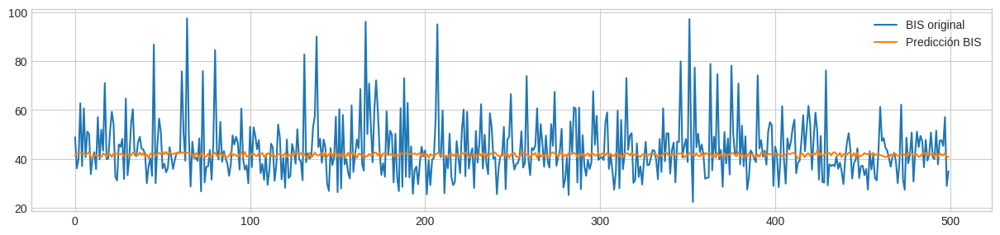

In [ ]:
from sklearn.svm import SVR
from sklearn.inspection import permutation_importance

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
model = SVR(kernel = 'rbf')

model.fit(X_trainset, y_trainset)
predTree=model.predict(X_testset)


mse = mean_squared_error(y_testset, predTree)
mae = mean_absolute_error(y_testset, predTree)
r2 = r2_score(y_testset, predTree)
correlation_coef, p_value = pearsonr(y_testset, predTree)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')


plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(predTree[0:500],'-',label='Predicción BIS')
plt.legend()
mean_absolute_error(y_testset, predTree)

'''
f_importance=permutation_importance(model,X,y)
importance=f_importance.importances_mean
print(importance)
'''

###Ramdon forest regression

MAE: 5.945675113059875
MSE: 82.0402033493677
R-squared: 0.4101294418710293
Correlación: 0.6463540791439464


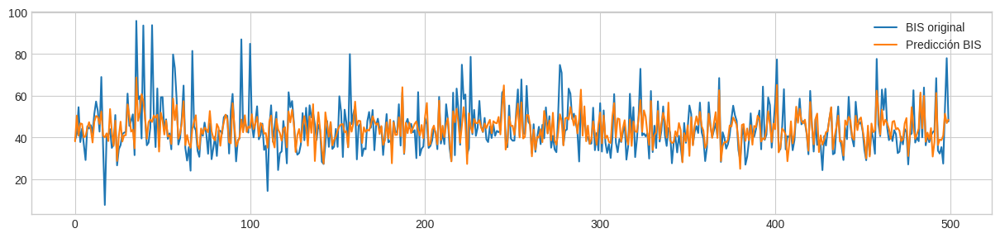

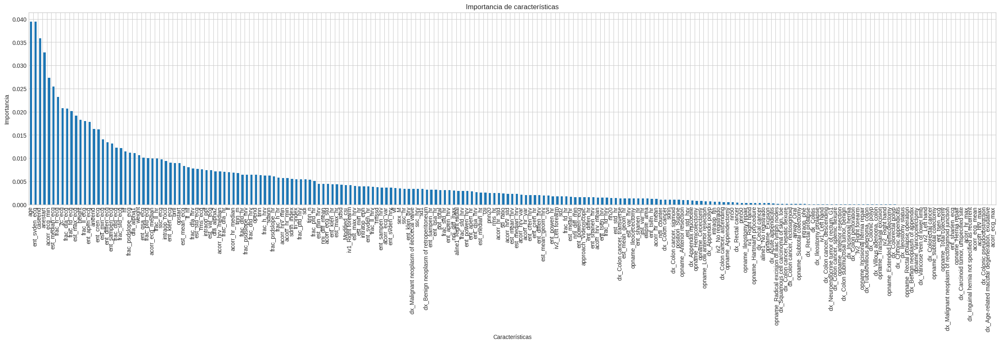

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression


y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
regr = RandomForestRegressor(criterion='poisson',max_depth=20, random_state=42)
modelo=regr.fit(X_trainset, y_trainset)
y_rest=modelo.predict(X_testset)


plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(y_rest[0:500],'-',label='Predicción BIS')
plt.legend()

mse = mean_squared_error(y_testset, y_rest)
mae = mean_absolute_error(y_testset, y_rest)
r2 = r2_score(y_testset, y_rest)
correlation_coef, p_value = pearsonr(y_testset, y_rest)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')



feature_importances = pd.Series(modelo.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(30,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)

plt.xlabel('Características')
plt.ylabel('Importancia')
plt.title('Importancia de características')
plt.show()

#feature_importances.index.tolist()



In [ ]:
feature_importances.index.tolist()

MAE: 4.926192763066226
MSE: 57.54839978993765
R-squared: 0.5553568062352423
Correlación: 0.7518589339671541


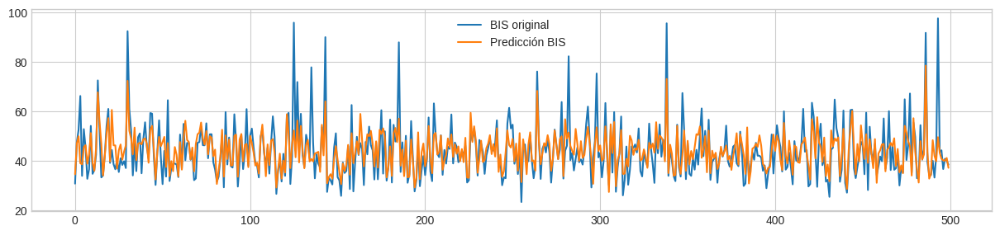

In [ ]:
lista=['ent_qsa_hr',
 'bmi',
 'opstart',
 'aneend',
 'aline1_No registrado',
 'age',
 'frac_sfd_ecg',
 'weight',
 'acorr_ecg_min',
 'ent_svden_ecg',
 'frac_dfa_ecg',
 'ent_klen_hr',
 'est_max_ecg',
 'anestart',
 'est_median_ecg',
 'frac_pfd_ecg',
 'ssc_ecg',
 'frac_h_ecg',
 'frac_ll_hr',
 'ent_cren_ecg',
 'frac_ll_ecg',
 'frac_fd_ecg',
 'ent_apen_ecg',
 'zc_ecg',
 'caseend',
 'approach_Videoscopic',
 'height',
 'ent_sampen_ecg',
 'intraop_rocu',
 'frac_psdslope_ecg',
 'opend',
 'frac_dfd_ecg',
 'est_min_ecg',
 'lf_hf',
 'intraop_ftn',
 'hf',
 'ent_klen_ecg',
 'dfa_alpha1',
 'ent_powen_hr',
 'sdi',
 'ent_diffen_ecg',
 'opname_Anterior resection',
 'acorr_ecg_median',
 'frac_h_hr',
 'dfa_alpha2',
 'frac_psdslope_hr',
 'tri_index',
 'sdnn_index',
 'frac_pfd_hr',
 'lf',
 'frac_h_hrv',
 'frac_pfd_hrv',
 'iv1_Left hand',
 'intraop_ppf',
 'ent_diffen_hr',
 'ent_qsa_ecg',
 'dx_Colon submucosal tumor, benign',
 'est_mean_ecg',
 'acorr_ecg_std',
 'frac_psdslope_hrv',
 'frac_dfa_hr',
 'pnn20',
 'sdann',
 'frac_dfa_hrv',
 'tinn',
 'tinn_m',
 'frac_dfd_hr',
 'vlf',
 'rms_ecg',
 'intraop_eph',
 'est_var_ecg',
 'acorr_hrv_min',
 'ent_klen_hrv',
 'est_std_ecg',
 'frac_dfd_hrv',
 'tinn_n',
 'ent_cren_hr',
 'est_min_hr',
 'ent_svden_hr',
 'acorr_ecg_var',
 'ssc_hr',
 'acorr_hr_median',
 'est_max_hrv',
 'ent_sampen_hrv',
 'nni_diff_mean',
 'acorr_hr_min',
 'nni_diff_max',
 'ssc_hrv',
 'acorr_hrv_median',
 'sdsd',
 'ent_apen_hrv',
 'ent_svden_hrv',
 'est_max_hr',
 'ent_powen_hrv',
 'ent_apen_hr',
 'frac_ll_hrv',
 'ent_sampen_hr',
 'ent_qsa_hrv',
 'Modified_csi',
 'est_min_hrv',
 'est_std_hr',
 'est_median_hr',
 'est_median_hrv',
 'ent_cren_hrv',
 'rmssd',
 'sd_ratio',
 'pot_total',
 'est_var_hr',
 'csi',
 'rms_hr',
 'sd1']




y=df_x['est_median_bis']
X=df_x[lista]#(df_x.drop('est_median_bis', axis=1))
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
regr = RandomForestRegressor(criterion='poisson',max_depth=20, random_state=42)
modelo=regr.fit(X_trainset, y_trainset)
y_rest=modelo.predict(X_testset)


plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(y_rest[0:500],'-',label='Predicción BIS')
plt.legend()

mse = mean_squared_error(y_testset, y_rest)
mae = mean_absolute_error(y_testset, y_rest)
r2 = r2_score(y_testset, y_rest)
correlation_coef, p_value = pearsonr(y_testset, y_rest)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')



###  KNeighborsRegressor

https://docs.kanaries.net/topics/Python/python-knn

MAE: 5.119284497632188
MSE: 65.08650347447387
R-squared: 0.48637892830131724
Correlación: 0.701353853947185


"\nresults = permutation_importance(model, X, y, scoring='neg_mean_squared_error')\nimportance = results.importances_mean\n\n#feature_importances = pd.Series(importance, index=X.columns)\nfeature_importances = feature_importances.sort_values(ascending=False)\nplt.figure(figsize=(30,6))\nax = feature_importances.plot(kind='bar', rot=45)\nax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')\n\nax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])\nax.set_xticklabels(feature_importances.index)\n\nplt.xlabel('Características')\nplt.ylabel('Importancia')\nplt.title('Importancia de características')\nplt.show()\n"

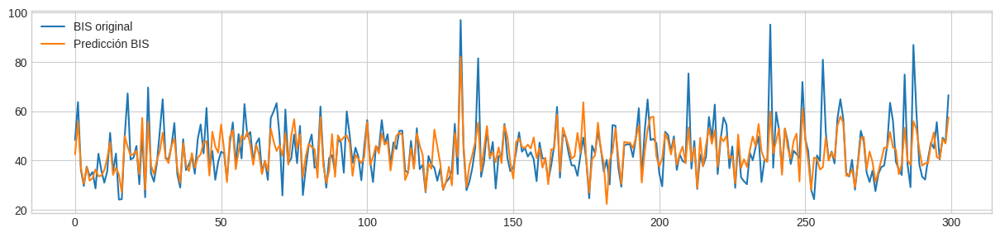

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import permutation_importance

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)

model = KNeighborsRegressor(n_neighbors=10,weights='uniform')   #si le pongo distance me da perfecto
model.fit(X, y)
y_rest=model.predict(X_testset)

mse = mean_squared_error(y_testset, y_rest)
mae = mean_absolute_error(y_testset, y_rest)
r2 = r2_score(y_testset, y_rest)
correlation_coef, p_value = pearsonr(y_testset, y_rest)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')


plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:300].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(y_rest[0:300],'-',label='Predicción BIS')
plt.legend()





'''
results = permutation_importance(model, X, y, scoring='neg_mean_squared_error')
importance = results.importances_mean

#feature_importances = pd.Series(importance, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(30,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)

plt.xlabel('Características')
plt.ylabel('Importancia')
plt.title('Importancia de características')
plt.show()
'''

### Bayesian Ridge Regression

MAE: 7.374373458198761
MSE: 113.08087685213412
R-squared: 0.13997949081693273
Correlación: 0.37462330224255364
MAE:7.374373458198761


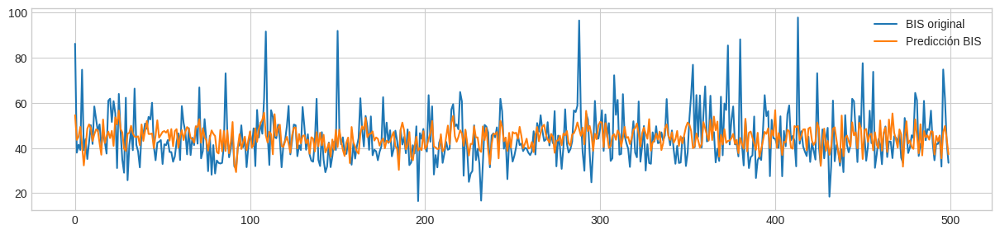

In [ ]:
from sklearn.linear_model import BayesianRidge

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
bay_ridge = BayesianRidge()
bay_ridge.fit(X_trainset, y_trainset)
ypred = bay_ridge.predict(X_testset)



mse = mean_squared_error(y_testset, ypred)
mae = mean_absolute_error(y_testset, ypred)
r2 = r2_score(y_testset, ypred)
correlation_coef, p_value = pearsonr(y_testset, ypred)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(ypred[0:500],'-',label='Predicción BIS')
plt.legend()
print(f'MAE:{mean_absolute_error(y_testset, ypred)}')



### Ridge regression

MAE: 7.14558197210278
MSE: 110.07276372854622
R-squared: 0.180273158431
Correlación: 0.424642931653059


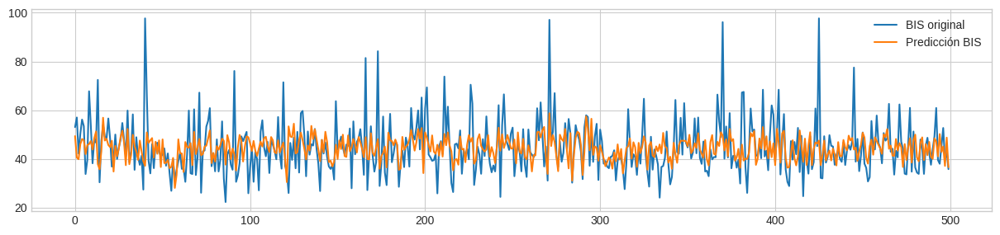

In [ ]:
from sklearn.linear_model import Ridge

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
ridge = Ridge(alpha=1.0)
ridge.fit(X_trainset, y_trainset)
ypred = ridge.predict(X_testset)


mse = mean_squared_error(y_testset, ypred)
mae = mean_absolute_error(y_testset, ypred)
r2 = r2_score(y_testset, ypred)
correlation_coef, p_value = pearsonr(y_testset, ypred)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(ypred[0:500],'-',label='Predicción BIS')
plt.legend()


###Kernel Ridge Regression

MAE: 7.262652489694978
MSE: 111.161669473076
R-squared: 0.16553605326477505
Correlación: 0.4073911112081873
MAE:7.262652489694978


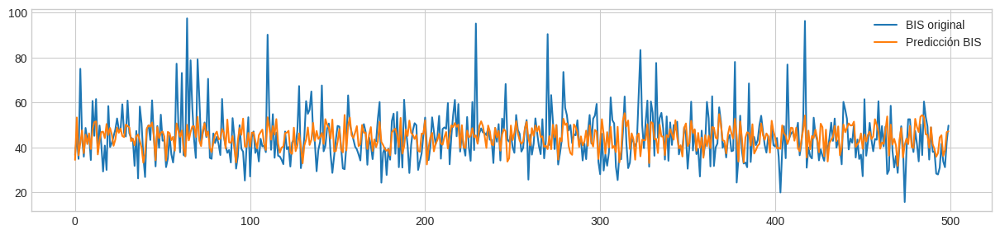

In [ ]:
from sklearn.kernel_ridge import KernelRidge

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
krr = KernelRidge(alpha=1.0)
krr.fit(X_trainset, y_trainset)
ypred = krr.predict(X_testset)
mse = mean_squared_error(y_testset, ypred)
mae = mean_absolute_error(y_testset, ypred)
r2 = r2_score(y_testset, ypred)
correlation_coef, p_value = pearsonr(y_testset, ypred)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(ypred[0:500],'-',label='Predicción BIS')
plt.legend()
print(f'MAE:{mean_absolute_error(y_testset, ypred)}')

### Lasso regression

MAE: 7.236549726543251
MSE: 107.79280251059241
R-squared: 0.17613549170326126
Correlación: 0.4288799618095663


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.380e+05, tolerance: 1.137e+02
  model = cd_fast.enet_coordinate_descent(


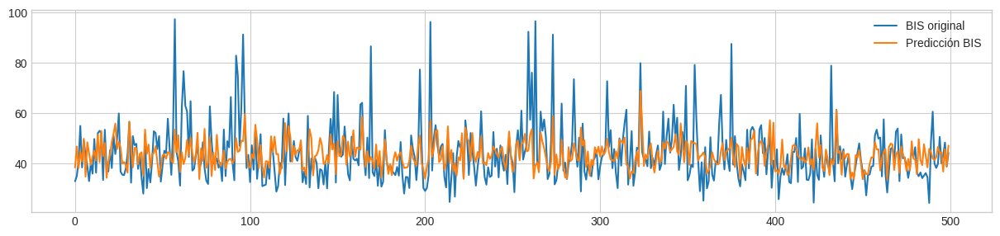

In [ ]:
from sklearn import linear_model

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
clf = linear_model.Lasso(alpha=0.1)
clf.fit(X_trainset, y_trainset)
ypred = clf.predict(X_testset)

mse = mean_squared_error(y_testset, ypred)
mae = mean_absolute_error(y_testset, ypred)
r2 = r2_score(y_testset, ypred)
correlation_coef, p_value = pearsonr(y_testset, ypred)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')
plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(ypred[0:500],'-',label='Predicción BIS')
plt.legend()


### Elastic Net Regression

MAE: 7.254246029170165
MSE: 103.80027150861008
R-squared: 0.19682870684814013


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.187e+05, tolerance: 1.143e+02
  model = cd_fast.enet_coordinate_descent(


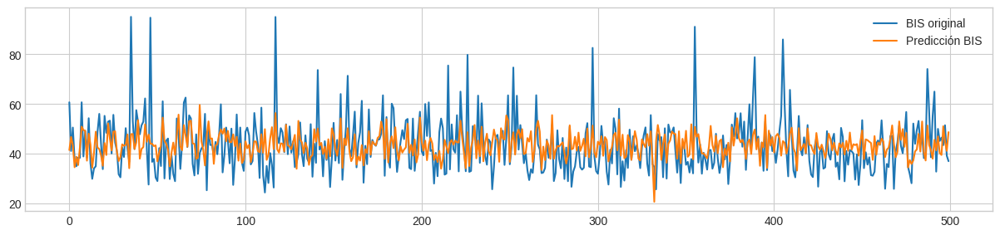

In [ ]:
from sklearn.linear_model import ElasticNet

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
regr = ElasticNet(random_state=0)
regr.fit(X_trainset, y_trainset)
ypred = regr.predict(X_testset)

mse = mean_squared_error(y_testset, ypred)
mae = mean_absolute_error(y_testset, ypred)
r2 = r2_score(y_testset, ypred)
correlation_coef, p_value = pearsonr(y_testset, ypred)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(ypred[0:500],'-',label='Predicción BIS')
plt.legend()


### MLPRegressor

MAE: 492.0360973613918
MSE: 79027714.75074281
R-squared: -588744.1363461247
Correlación: 0.0010612250026096777


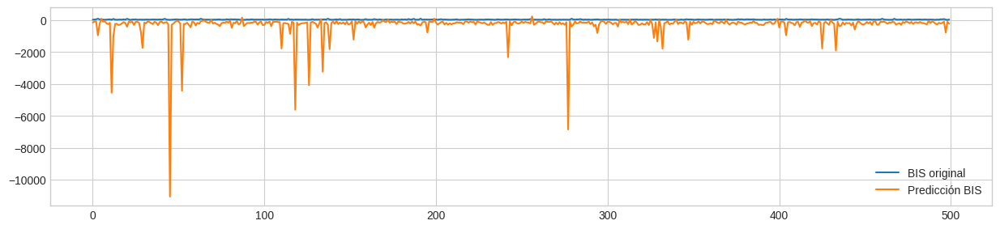

In [ ]:
from sklearn.neural_network import MLPRegressor

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)
regr = MLPRegressor(random_state=1, max_iter=1000)
regr.fit(X_trainset, y_trainset)
ypred = regr.predict(X_testset)

mse = mean_squared_error(y_testset, ypred)
mae = mean_absolute_error(y_testset, ypred)
r2 = r2_score(y_testset, ypred)
correlation_coef, p_value = pearsonr(y_testset, ypred)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(ypred[0:500],'-',label='Predicción BIS')
plt.legend()


###AdaBoostRegressor

MAE: 11.12971738331047
MSE: 175.6998050187297
R-squared: -0.38363954697344793
Correlación: 0.38670616848499206


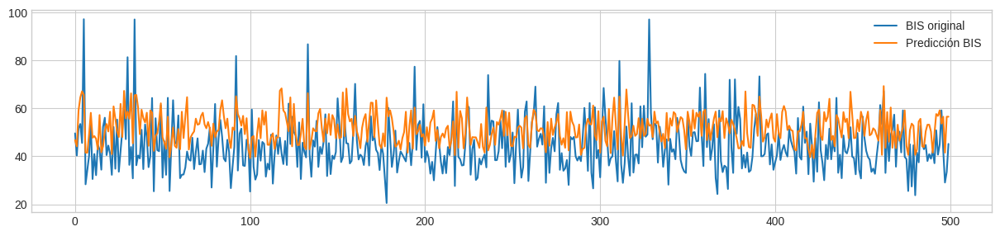

In [ ]:
from sklearn.ensemble import AdaBoostRegressor

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)

regr = AdaBoostRegressor(random_state=0, n_estimators=500)
regr.fit(X_trainset, y_trainset)
ypred=regr.predict(X_testset)

mse = mean_squared_error(y_testset, ypred)
mae = mean_absolute_error(y_testset, ypred)
r2 = r2_score(y_testset, ypred)
correlation_coef, p_value = pearsonr(y_testset, ypred)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(ypred[0:500],'-',label='Predicción BIS')
plt.legend()


### ExtraTreesRegressor

Con cada Paciente

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.datasets import make_regression
from sklearn.ensemble import RandomForestRegressor

lista=[
 'est_max_ecg','est_min_ecg','est_median_ecg','est_mean_ecg','est_var_ecg','acorr_ecg_max','acorr_ecg_min',
 'acorr_ecg_median','acorr_ecg_mean','acorr_ecg_var','frac_psdslope_ecg','frac_dfd_ecg','frac_dfa_ecg',
 'ent_tsen_ecg','ent_svden_ecg','ent_klen_ecg','ssc_ecg','est_var_hrv','acorr_hrv_max','acorr_hrv_min',
 'frac_psdslope_hrv','frac_dfd_hrv','frac_h_hrv','ent_shanen_hrv','ent_powen_hrv','nni_diff_min',
 'sdnn_index','sdann','tinn_m','tinn','tri_index','hf','lf_hf','sd_ratio','ellipse_area','dfa_alpha2',
 'sdi','est_var_hr','acorr_hr_max','acorr_hr_median','ent_sampen_hr','ssc_hr']

X=df.drop(columns=['est_median_bis','key','id_case'], axis=1)
y=df['est_median_bis'].values.reshape(-1, 1)
y_target,df_x,TargetVarScalerFit=escalar_datos(X,y,False,df)

id_unique=df_x['key'].unique().tolist()
conteo_valores = df_x['key'].value_counts()
id_unique = conteo_valores[conteo_valores < 6].index.tolist()
df_x = df_x[~df_x['key'].isin(id_unique)].reset_index(drop=True)

df_x2=df_x.copy()
df_x2['est_median_bis']=y_target['est_median_bis']
id_unique=df_x2['id_case'].unique().tolist()
df_train=df_x2[df_x2['id_case'].isin(id_unique[:len(id_unique)-1])]
df_test=df_x2[df_x2['id_case'].isin(id_unique[len(id_unique)-1:])]

train_index_lista=df_train['key'].unique().tolist()
test_index_lista=df_test['key'].unique().tolist()


random_state=5
for i in range(0,len(train_index_lista),1):
  data=df_x.loc[df_x['key']==train_index_lista[i]].reset_index(drop=True)
  X=data[lista]
  y=y_target.loc[y_target['key']==train_index_lista[i]].reset_index(drop=True)
  y=y['est_median_bis'].values.T
  if i==0:
    regr = ExtraTreesRegressor(random_state=random_state, n_estimators=10)
  regr.fit(X, y)

#joblib.dump(model, 'model_60_ExtraTree.pkl')
#XGBRegressor(n_estimators=500, max_depth=10) #valores entre uno y 10
#RandomForestRegressor(criterion='poisson',max_depth=20, random_state=0)

[['5_0', '5_1', '5_2']]


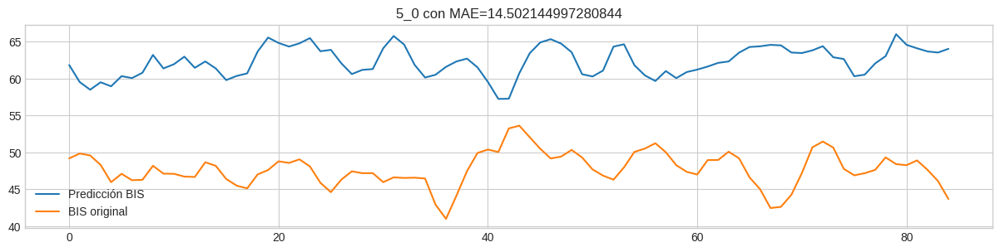

In [ ]:
prefijos = df_test['id_case'].unique().tolist()
lista_de_listas = []
for prefijo in prefijos:
    sublista = [elem for elem in test_index_lista if elem.startswith(str(prefijo))]
    lista_de_listas.append(sublista)
print(lista_de_listas)


#Probando los pacientes
maes=[]
for i in range(0,len(lista_de_listas),1):
  X=df_x[df_x['key'].isin(lista_de_listas[i])][lista]
  y=y_target[y_target['key'].isin(lista_de_listas[i])]
  y=y['est_median_bis'].values.T
  yh=regr.predict(X)

  #yh=TargetVarScalerFit.inverse_transform(yh.reshape(-1, 1))
  #y=TargetVarScalerFit.inverse_transform(y.reshape(-1, 1))

  mse = mean_squared_error(yh, y)
  mae = mean_absolute_error(yh, y)
  maes.append(mae)

  yhat = signal.savgol_filter(yh, window_length=6, polyorder=2, mode="nearest")
  ytest= signal.savgol_filter(y, window_length=6, polyorder=2, mode="nearest")

  plt.figure(figsize=(15, 7))
  plt.subplot(211)
  plt.title(f'{test_index_lista[i]} con MAE={mae}')
  plt.plot(yhat,label='Predicción BIS')
  plt.legend()
  plt.subplot(211)
  plt.plot(ytest, label='BIS original')
  plt.legend()

In [ ]:
df_x['key']==['20_0', '20_1', '20_2', '20_3', '20_4']

Con todas las carcateristicas

MAE: 4.5020265445931535
MSE: 49.90822252268804
R-squared: 0.6054973462643527
Correlación: 0.779755412203521


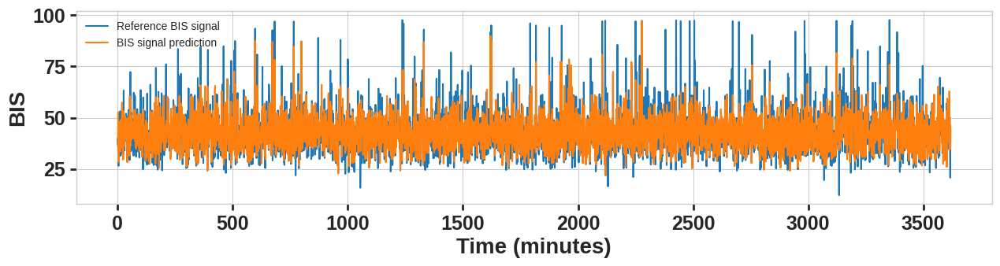

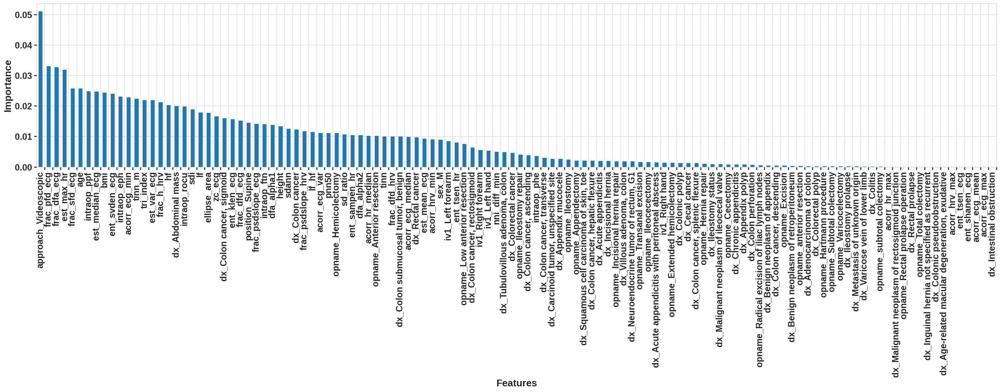

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
random_state=5  #podria ser la 4
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3,random_state=random_state)

regr = ExtraTreesRegressor(random_state=random_state, n_estimators=150)
regr.fit(X_trainset, y_trainset)
ypred=regr.predict(X_testset)

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset.values,'-', label='Reference BIS signal ')
plt.legend(fontsize=10,loc='upper left')
plt.subplot(211)
plt.plot(ypred,'-',label='BIS signal prediction')
plt.legend(fontsize=10,loc='upper left')
plt.xlabel('Time (minutes)',fontsize=20,fontweight='bold')
plt.ylabel('BIS',fontsize=20,fontweight='bold')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')

mse = mean_squared_error(y_testset, ypred)
mae = mean_absolute_error(y_testset, ypred)
r2 = r2_score(y_testset, ypred)
correlation_coef, p_value = pearsonr(y_testset, ypred)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')



feature_importances = pd.Series(regr.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(35,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)

plt.xlabel('Features',fontsize=20,fontweight='bold')
plt.ylabel('Importance',fontsize=20,fontweight='bold')
#plt.title('Importancia de características')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')
plt.show()

In [ ]:
valores=feature_importances.values.tolist()
c=0
cont=0

while c<0.94:
  c=valores[cont]+c
  cont=cont+1
columnas=feature_importances.index.tolist()
print(columnas[cont])

opname_Ileostomy repair


In [ ]:
feature_importances.index.tolist()

['approach_Videoscopic',
 'frac_pfd_ecg',
 'frac_dfa_ecg',
 'est_max_hr',
 'frac_sfd_ecg',
 'age',
 'intraop_ppf',
 'est_median_ecg',
 'bmi',
 'ent_svden_ecg',
 'intraop_eph',
 'acorr_ecg_min',
 'tinn_m',
 'tri_index',
 'est_var_ecg',
 'frac_h_hrv',
 'hf',
 'dx_Abdominal mass',
 'intraop_rocu',
 'sdi',
 'lf',
 'ellipse_area',
 'zc_ecg',
 'dx_Colon cancer, sigmoid',
 'ent_klen_ecg',
 'frac_dfd_ecg',
 'position_Supine',
 'frac_psdslope_ecg',
 'intraop_ftn',
 'dfa_alpha1',
 'height',
 'sdann',
 'dx_Colon cancer',
 'frac_psdslope_hrv',
 'lf_hf',
 'acorr_ecg_var',
 'pnn50',
 'opname_Hemicolectomy',
 'sd_ratio',
 'ent_sampen_hr',
 'dfa_alpha2',
 'acorr_hr_median',
 'opname_Anterior resection',
 'tinn',
 'frac_dfd_hrv',
 'dx_Colon submucosal tumor, benign',
 'acorr_ecg_median',
 'dx_Rectal cancer',
 'est_mean_ecg',
 'acorr_hrv_min',
 'sex_M',
 'iv1_Left forearm',
 'ent_tsen_hr',
 'opname_Low anterior resection',
 'dx_Colon cancer, rectosigmoid',
 'iv1_Right forearm',
 'iv1_Left hand',
 'nni_d

MAE: 4.484399557173459
MSE: 49.54748324707759
R-squared: 0.6083488323390231
Correlación: 0.7817783787125918


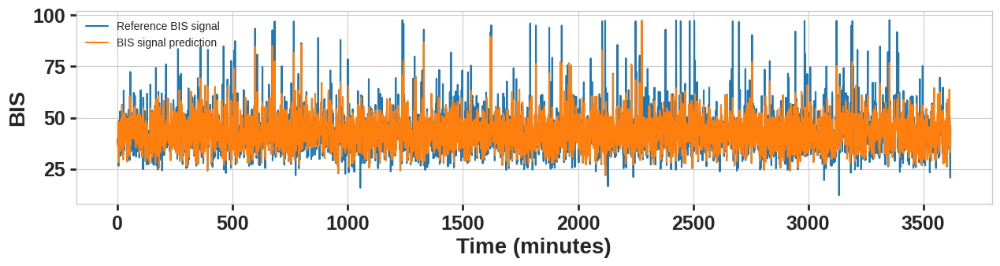

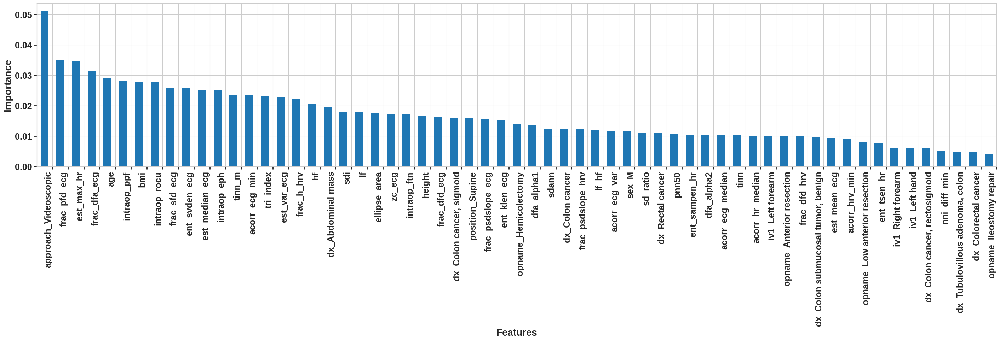

In [ ]:
lista=['approach_Videoscopic',
 'frac_pfd_ecg',
 'frac_dfa_ecg',
 'est_max_hr',
 'frac_sfd_ecg',
 'age',
 'intraop_ppf',
 'est_median_ecg',
 'bmi',
 'ent_svden_ecg',
 'intraop_eph',
 'acorr_ecg_min',
 'tinn_m',
 'tri_index',
 'est_var_ecg',
 'frac_h_hrv',
 'hf',
 'dx_Abdominal mass',
 'intraop_rocu',
 'sdi',
 'lf',
 'ellipse_area',
 'zc_ecg',
 'dx_Colon cancer, sigmoid',
 'ent_klen_ecg',
 'frac_dfd_ecg',
 'position_Supine',
 'frac_psdslope_ecg',
 'intraop_ftn',
 'dfa_alpha1',
 'height',
 'sdann',
 'dx_Colon cancer',
 'frac_psdslope_hrv',
 'lf_hf',
 'acorr_ecg_var',
 'pnn50',
 'opname_Hemicolectomy',
 'sd_ratio',
 'ent_sampen_hr',
 'dfa_alpha2',
 'acorr_hr_median',
 'opname_Anterior resection',
 'tinn',
 'frac_dfd_hrv',
 'dx_Colon submucosal tumor, benign',
 'acorr_ecg_median',
 'dx_Rectal cancer',
 'est_mean_ecg',
 'acorr_hrv_min',
 'sex_M',
 'iv1_Left forearm',
 'ent_tsen_hr',
 'opname_Low anterior resection',
 'dx_Colon cancer, rectosigmoid',
 'iv1_Right forearm',
 'iv1_Left hand',
 'nni_diff_min',
 'dx_Tubulovillous adenoma, colon',
 'dx_Colorectal cancer',
 'opname_Ileostomy repair']
y=df_x['est_median_bis']
X=df_x[lista]
random_state=5
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3,random_state=random_state)

regr = ExtraTreesRegressor(random_state=random_state, n_estimators=150)
regr.fit(X_trainset, y_trainset)
ypred=regr.predict(X_testset)


plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset.values,'-', label='Reference BIS signal ')
plt.legend(fontsize=10,loc='upper left')
plt.subplot(211)
plt.plot(ypred,'-',label='BIS signal prediction')
plt.legend(fontsize=10,loc='upper left')
plt.xlabel('Time (minutes)',fontsize=20,fontweight='bold')
plt.ylabel('BIS',fontsize=20,fontweight='bold')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')

mse = mean_squared_error(y_testset, ypred)
mae = mean_absolute_error(y_testset, ypred)
r2 = r2_score(y_testset, ypred)
correlation_coef, p_value = pearsonr(y_testset, ypred)


print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')



feature_importances = pd.Series(regr.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(35,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)

plt.xlabel('Features',fontsize=20,fontweight='bold')
plt.ylabel('Importance',fontsize=20,fontweight='bold')
#plt.title('Importancia de características')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')
plt.show()

Con un paciente

1401


<ipython-input-10-128001efb331>:22: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  modelo=reg.fit(X_trainset, y_trainset)


MAE: 4.720552768470198
MSE: 52.158379172979075
R-squared: -0.08011382650063625
Correlación: 0.22855001095681657


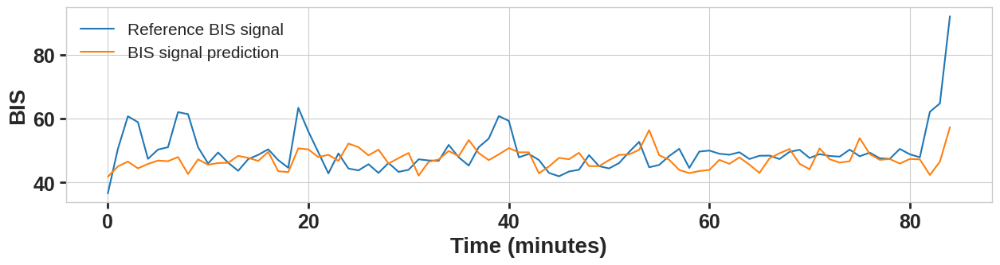

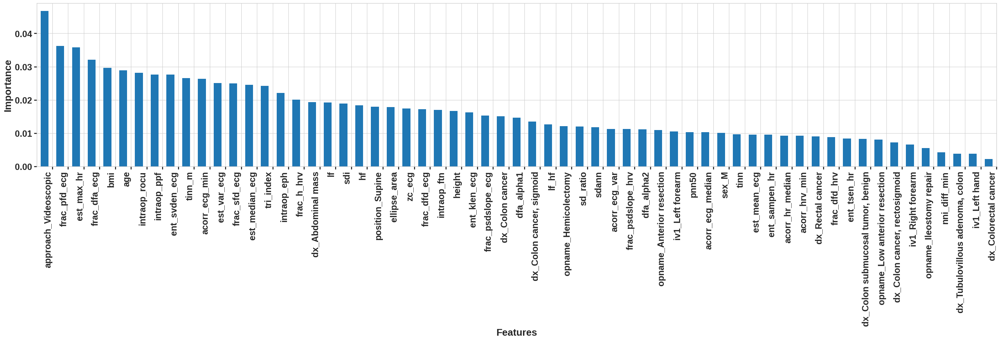

In [ ]:
from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesRegressor


y=df_x[['est_median_bis']]
X = df_x[lista]
gss = GroupShuffleSplit(n_splits=1, test_size=0.2)
train_index, test_index = next(gss.split(X, y, groups=df_x['id_case']))
unique_test_idcases = df_x.loc[test_index, 'id_case'].unique()
#selected_test_idcase = np.random.choice(unique_test_idcases)
selected_test_idcase=1401
print(selected_test_idcase)
X_testset = X.loc[df_x['id_case'] == selected_test_idcase]
y_testset = y.loc[df_x['id_case'] == selected_test_idcase]
X_trainset = X.loc[df_x['id_case'] != selected_test_idcase]
y_trainset = y.loc[df_x['id_case'] != selected_test_idcase]
scaler = StandardScaler()
X_trainset = scaler.fit_transform(X_trainset)
X_testset = scaler.transform(X_testset)
reg = ExtraTreesRegressor(random_state=5, n_estimators=35)
modelo=reg.fit(X_trainset, y_trainset)
ypred=modelo.predict(X_testset)

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset['est_median_bis'].values,'-', label='Reference BIS signal ')
plt.legend(fontsize=15,loc='upper left')
plt.subplot(211)
plt.plot(ypred,'-',label='BIS signal prediction')
plt.legend(fontsize=15,loc='upper left')
plt.xlabel('Time (minutes)',fontsize=20,fontweight='bold')
plt.ylabel('BIS',fontsize=20,fontweight='bold')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')

mse = mean_squared_error(y_testset['est_median_bis'].values, ypred)
mae = mean_absolute_error(y_testset['est_median_bis'].values, ypred)
r2 = r2_score(y_testset['est_median_bis'].values, ypred)
correlation_coef, p_value = pearsonr(y_testset['est_median_bis'].values, ypred)
print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

feature_importances = pd.Series(modelo.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)
plt.figure(figsize=(35,6))
ax = feature_importances.plot(kind='bar', rot=45)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')
ax.set_xticks([i + 0.5 for i in range(len(feature_importances.index))])
ax.set_xticklabels(feature_importances.index)

plt.xlabel('Features',fontsize=20,fontweight='bold')
plt.ylabel('Importance',fontsize=20,fontweight='bold')
#plt.title('Importancia de características')
plt.tick_params(axis='both', which='major', labelsize=18, width=2, length=6, direction="out")
plt.xticks(fontweight='bold')  # Establecer la negrita para los números en el eje x
plt.yticks(fontweight='bold')
plt.show()

#4567,3048,3253

In [ ]:
y_testset['est_median_bis'].values

### CatBoost Regressor

In [ ]:
!pip install catboost

0:	learn: 10.9594792	total: 81.3ms	remaining: 81.3ms
1:	learn: 10.7570603	total: 110ms	remaining: 0us
MAE:7.57939714552851


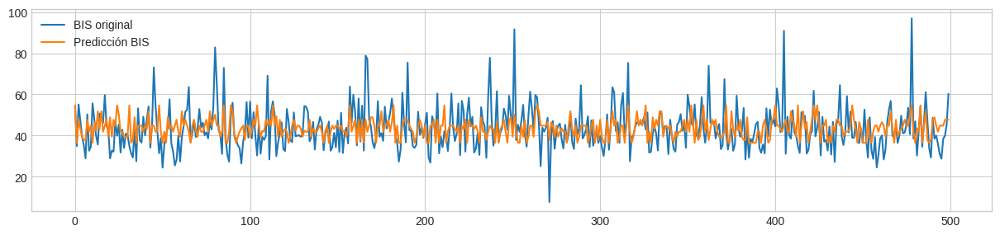

In [ ]:

from catboost import CatBoostRegressor

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)

regr = CatBoostRegressor(iterations=2,
                          learning_rate=1,
                          depth=2)
regr.fit(X_trainset, y_trainset)
ypred=regr.predict(X_testset)

mse = mean_squared_error(y_testset, ypred)
mae = mean_absolute_error(y_testset, ypred)
r2 = r2_score(y_testset, ypred)
correlation_coef, p_value = pearsonr(y_testset, ypred)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')

plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(ypred[0:500],'-',label='Predicción BIS')
plt.legend()



### LGBM Regressor

In [ ]:
!pip install lightgbm

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018927 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 30519
[LightGBM] [Info] Number of data points in the train set: 8804, number of used features: 213
[LightGBM] [Info] Start training from score 43.759233
MAE:5.160765531510281


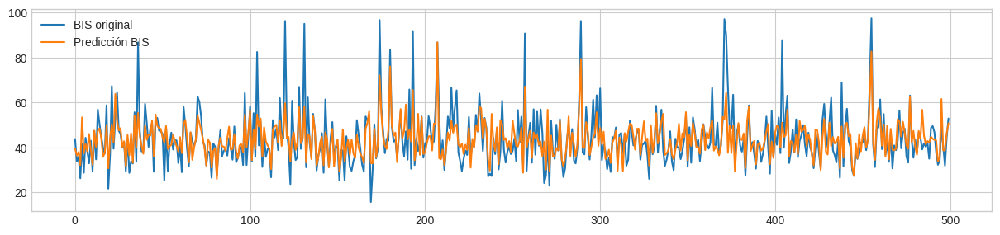

In [ ]:
import lightgbm as ltb

y=df_x['est_median_bis']
X=df_x.drop(['est_median_bis','id_case'], axis=1)
X_trainset, X_testset, y_trainset,y_testset=train_test_split(X,y,test_size=0.3)

regr =  ltb.LGBMRegressor()
regr.fit(X_trainset.values, y_trainset.values)
ypred=regr.predict(X_testset)

mse = mean_squared_error(y_testset, ypred)
mae = mean_absolute_error(y_testset, ypred)
r2 = r2_score(y_testset, ypred)
correlation_coef, p_value = pearsonr(y_testset, ypred)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'R-squared: {r2}')
print(f'Correlación: {correlation_coef}')


plt.figure(figsize=(15,7))
plt.subplot(211)
plt.plot(y_testset[0:500].values,'-', label='BIS original')
plt.legend()
plt.subplot(211)
plt.plot(ypred[0:500],'-',label='Predicción BIS')
plt.legend()
print(f'MAE:{mean_absolute_error(y_testset, ypred)}')